# Predicción de notas

Albert Barreiro Díaz

Ramón Cano Aparicio


In [ ]:
!pip install dython  --upgrade --user --quiet
!pip install pandas --upgrade --user --quiet
!pip install --upgrade --quiet lime
#!pip install keras --upgrade --user --quiet
#!pip install tensorflow --upgrade --user --quiet

Dataset: http://archive.ics.uci.edu/ml/datasets/Student+Performance

In [ ]:
#%matplotlib notebook
import pandas as pd
from pandas import Series
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
import seaborn as sns
import pandas as pd
from collections import Counter
from IPython.core.interactiveshell import InteractiveShell
from sklearn.model_selection import train_test_split
import warnings
from dython.nominal import associations
import lime
import lime.lime_tabular
import time

from sklearn.model_selection import GridSearchCV

# Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, RandomizedSearchCV

# LASSO
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso

# SVM
from sklearn.svm import SVR

# MLP
from sklearn.neural_network import MLPRegressor
#import keras
#from keras.models import Sequential
#from keras.layers import Dense, InputLayer
from sklearn.metrics import mean_squared_error

from joblib import dump, load

from sklearn.preprocessing import MinMaxScaler
from scipy.stats import boxcox

InteractiveShell.ast_node_interactivity = "all"
pd.set_option('precision', 3)
sns.set()
warnings.filterwarnings('ignore')

In [ ]:
!pip freeze

absl-py==0.12.0
alabaster==0.7.12
albumentations==0.1.12
altair==4.1.0
appdirs==1.4.4
argcomplete==1.12.3
argon2-cffi==21.3.0
argon2-cffi-bindings==21.2.0
arviz==0.11.4
astor==0.8.1
astropy==4.3.1
astunparse==1.6.3
atari-py==0.2.9
atomicwrites==1.4.0
attrs==21.2.0
audioread==2.1.9
autograd==1.3
Babel==2.9.1
backcall==0.2.0
beautifulsoup4==4.6.3
bleach==4.1.0
blis==0.4.1
bokeh==2.3.3
Bottleneck==1.3.2
branca==0.4.2
bs4==0.0.1
CacheControl==0.12.10
cached-property==1.5.2
cachetools==4.2.4
catalogue==1.0.0
certifi==2021.10.8
cffi==1.15.0
cftime==1.5.1.1
chardet==3.0.4
charset-normalizer==2.0.9
click==7.1.2
cloudpickle==1.3.0
cmake==3.12.0
cmdstanpy==0.9.5
colorcet==2.0.6
colorlover==0.3.0
community==1.0.0b1
contextlib2==0.5.5
convertdate==2.3.2
coverage==3.7.1
coveralls==0.5
crcmod==1.7
cufflinks==0.17.3
cvxopt==1.2.7
cvxpy==1.0.31
cycler==0.11.0
cymem==2.0.6
Cython==0.29.24
daft==0.0.4
dask==2.12.0
datascience==0.10.6
debugpy==1.0.0
decorator==4.4.2
defusedxml==0.7.1
descartes==1.1.0
dil

In [ ]:
student_data = pd.read_csv('student-mat.csv', header=0, delimiter=';')
student_data = student_data.drop(columns = ['G1', 'G2'])

X =  student_data.drop(columns = ['G3'])
y =  student_data['G3']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=2)

## Pre-processing

In [ ]:
X_train.shape

(316, 30)

In [ ]:
X_train

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences
278,GP,F,18,U,GT3,T,4,4,health,health,reputation,father,1,2,1,yes,yes,no,yes,yes,yes,yes,yes,2,4,4,1,1,4,15
203,GP,F,17,R,GT3,T,2,2,other,other,reputation,mother,1,1,0,no,yes,no,no,yes,yes,yes,no,5,3,2,1,2,3,18
339,GP,F,17,R,GT3,A,3,2,other,other,home,mother,1,2,0,no,yes,yes,no,yes,yes,yes,no,4,3,3,2,3,2,4
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2
262,GP,M,18,R,GT3,T,3,2,other,other,course,mother,1,3,0,no,no,no,yes,no,yes,no,no,5,3,2,1,1,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299,GP,M,18,U,LE3,T,4,4,teacher,teacher,home,mother,1,1,0,no,yes,yes,no,yes,yes,yes,yes,1,4,2,2,2,1,5
22,GP,M,16,U,LE3,T,4,2,teacher,other,course,mother,1,2,0,no,no,no,yes,yes,yes,yes,no,4,5,1,1,3,5,2
72,GP,F,15,R,GT3,T,1,1,other,other,reputation,mother,1,2,2,yes,yes,no,no,no,yes,yes,yes,3,3,4,2,4,5,2
15,GP,F,16,U,GT3,T,4,4,health,other,home,mother,1,1,0,no,yes,no,no,yes,yes,yes,no,4,4,4,1,2,2,4


### Comprobar missing values

Al ver count no vemos que falte ningun valor.

Seguimos explorando los datos para comprobar que los valores missing no estén codificados de otra manera.

In [ ]:
X_train.describe()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences
count,316.000,316.000,316.000,316.000,316.000,316.000,316.000,316.000,316.000,316.000,316.000,316.000,316.000
mean,16.696,2.734,2.503,1.453,2.028,0.326,3.956,3.237,3.111,1.446,2.222,3.535,5.902
std,1.283,1.118,1.097,0.709,0.833,0.711,0.904,1.013,1.094,0.836,1.261,1.410,8.534
min,15.000,0.000,0.000,1.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000
25%,16.000,2.000,2.000,1.000,1.000,0.000,4.000,3.000,2.000,1.000,1.000,3.000,0.000
50%,17.000,3.000,2.000,1.000,2.000,0.000,4.000,3.000,3.000,1.000,2.000,4.000,4.000
75%,18.000,4.000,3.000,2.000,2.000,0.000,5.000,4.000,4.000,2.000,3.000,5.000,8.000
max,22.000,4.000,4.000,4.000,4.000,3.000,5.000,5.000,5.000,5.000,5.000,5.000,75.000


In [ ]:
X_train.dtypes

school        object
sex           object
age            int64
address       object
famsize       object
Pstatus       object
Medu           int64
Fedu           int64
Mjob          object
Fjob          object
reason        object
guardian      object
traveltime     int64
studytime      int64
failures       int64
schoolsup     object
famsup        object
paid          object
activities    object
nursery       object
higher        object
internet      object
romantic      object
famrel         int64
freetime       int64
goout          int64
Dalc           int64
Walc           int64
health         int64
absences       int64
dtype: object

Miramos si obtenemos algun nan tanto en los atributos numericos como en los categoricos.

Tampoco parece que falten valores.

In [ ]:
X_train.isna().sum()

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
dtype: int64

Comprobamos gráficamente si encontramos outliers tanto en las variables categoricas como en las numericas.


En el caso de las categoricas:

Contrastando la información sobre los atributos que nos facilita la página web,  no hemos visto que haya ningun tipo de valor que este codificando missing values.

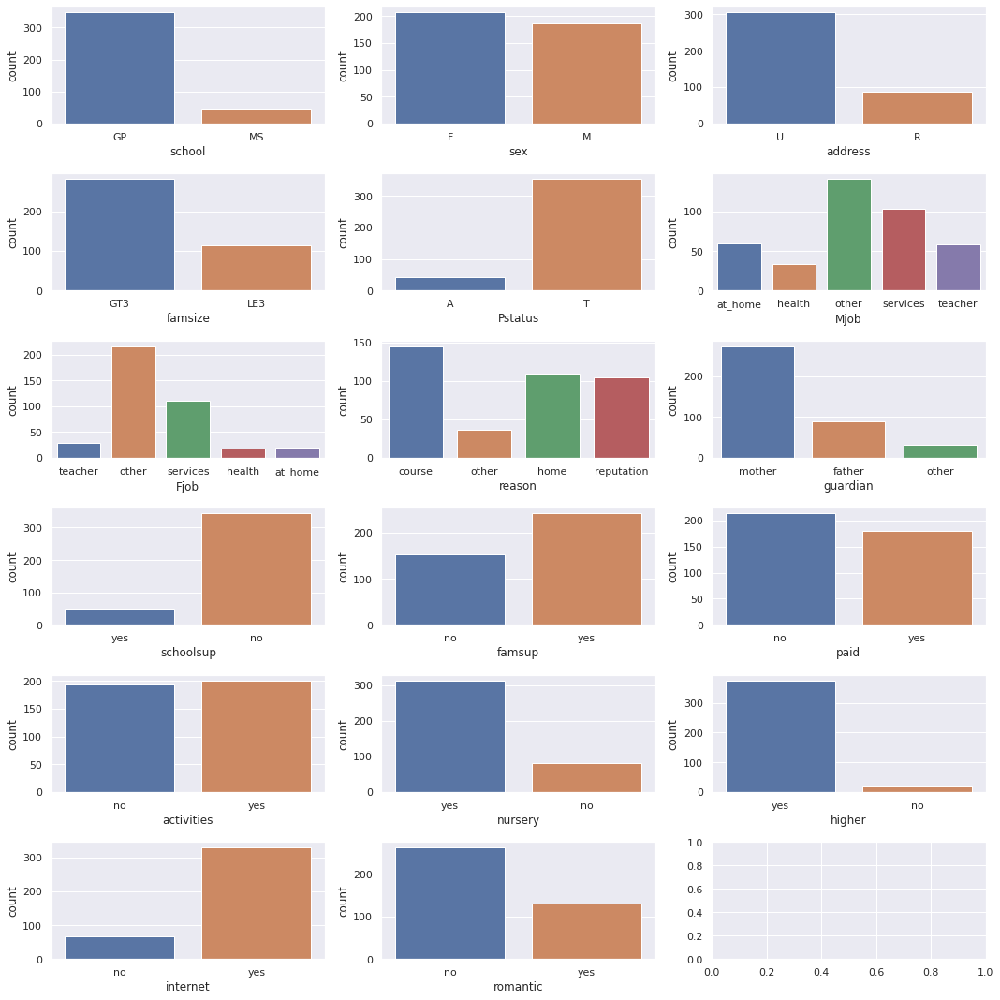

In [ ]:
categorical_variables = X_train.dtypes[student_data.dtypes=='object'].index

fig, axes = plt.subplots(6,3,figsize=(15,15));

for i, c in enumerate(categorical_variables):
    if c =='y':
        continue
    ax = axes.reshape(-1)[i];
    sns.countplot(student_data[c],ax=ax);
plt.tight_layout();

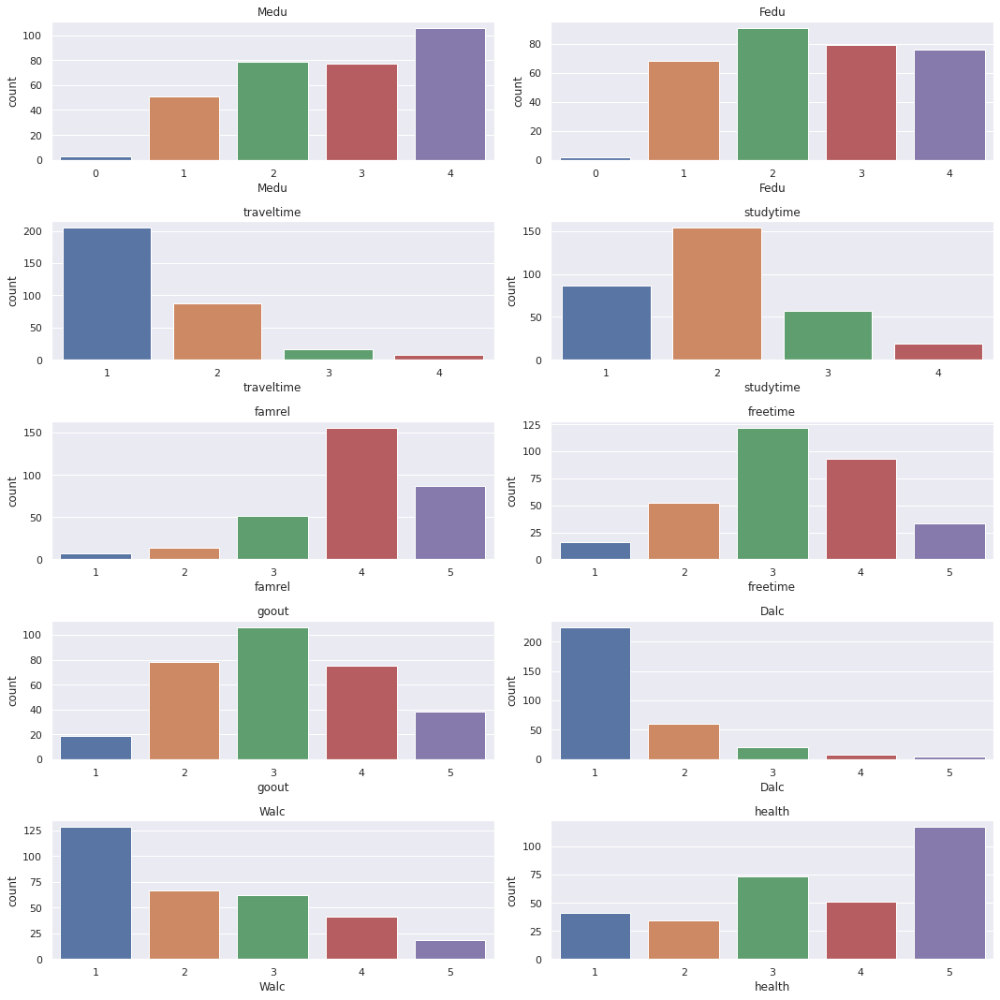

In [ ]:
categorical_variables = ['Medu', 'Fedu', 'traveltime', 'studytime', 'famrel', 'freetime', 'goout', 'Dalc', 'Walc', 'health']

fig, axes = plt.subplots(5,2,figsize=(15,15));

for i, c in enumerate(categorical_variables):
    if c =='y':
        continue
    ax = axes.reshape(-1)[i];
    sns.countplot(X_train[c],ax=ax);
    t = ax.set_title(c);
plt.tight_layout();

En el caso de las numericas:

Tampoco hemos visto ningun tipo de outlier o valor que este codificando missing values.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f7169b3bd90>,
      dtype=object)

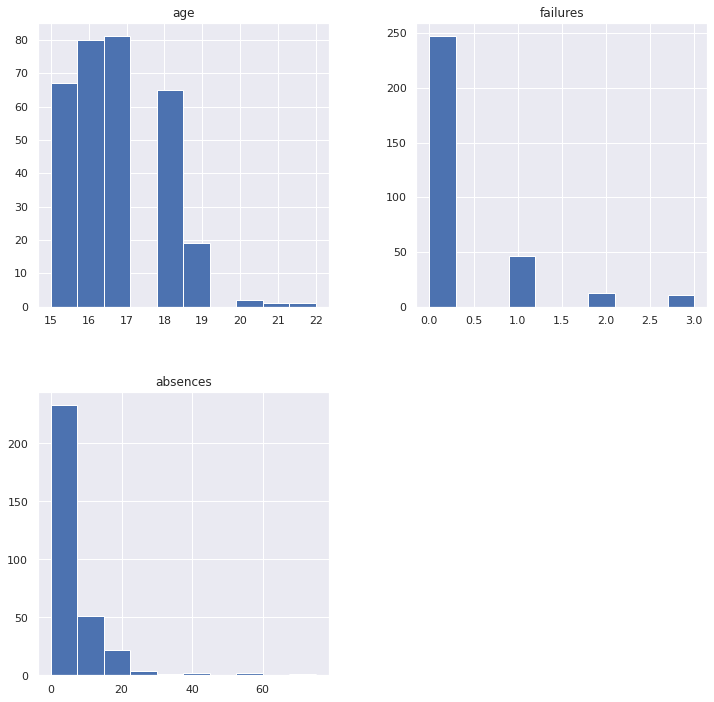

In [ ]:
X_train[['age', 'failures', 'absences']].hist(figsize=(12,12), layout=(2,2))

### Outliers

En el caso de *age* y *failures* nos parece que los valores son razonables así que no consideramos modificarlos o borrarlos.

En *absences*, los outliers difieren bastante del resto de los datos.

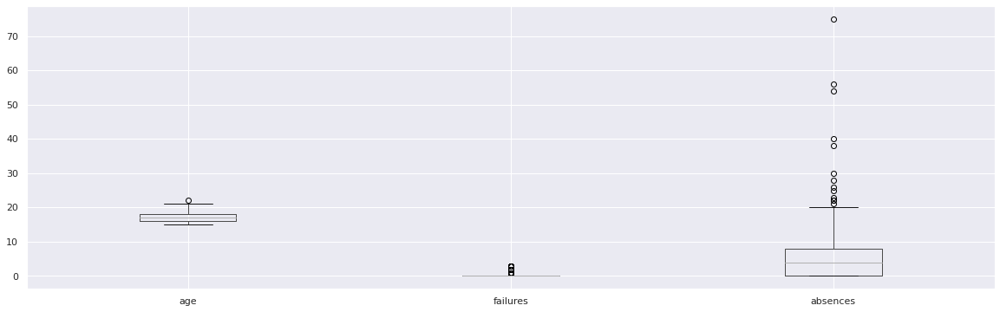

In [ ]:
fig, ax = plt.subplots(figsize=(20, 6))
X_train[['age', 'failures', 'absences']].boxplot()

En Portugal si tu nota es mayor a 9,4 estás aprobado. Si estás entre 13.5 y 15.4 tu nota es buena.

Alumnos que faltan mucho y aprueban:

<BarContainer object of 2 artists>

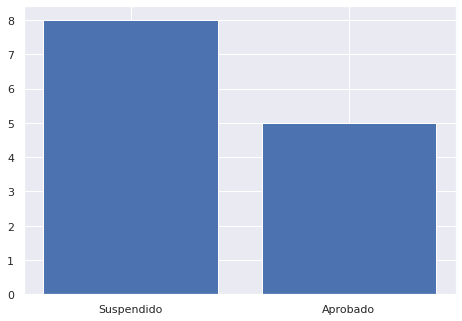

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['Suspendido', 'Aprobado']
students = [(y_train[X_train['absences'] > 20] < 9.5).sum(), (y_train[X_train['absences'] > 20] >= 9.5).sum()]
ax.bar(langs,students)
plt.show()

Alumnos que faltan poco y aprueban:

<BarContainer object of 2 artists>

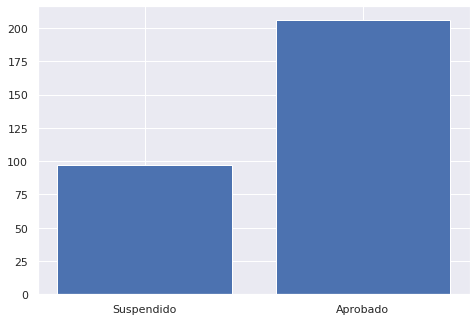

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['Suspendido', 'Aprobado']
students = [(y_train[X_train['absences'] <= 20] < 9.5).sum(), (y_train[X_train['absences'] <= 20] >= 9.5).sum()]
ax.bar(langs,students)
plt.show()

Alumnos que faltan mucho y sacan buena nota:

<BarContainer object of 2 artists>

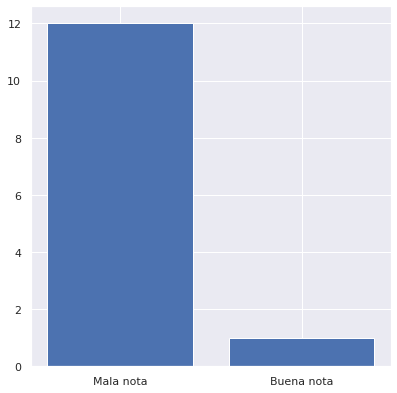

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['Mala nota', 'Buena nota']
students = [(y_train[X_train['absences'] > 20] < 13.5).sum(), (y_train[X_train['absences'] > 20] >= 13.5).sum()]
ax.bar(langs,students)
plt.show()

Alumnos que faltan poco y sacan buena nota

<BarContainer object of 2 artists>

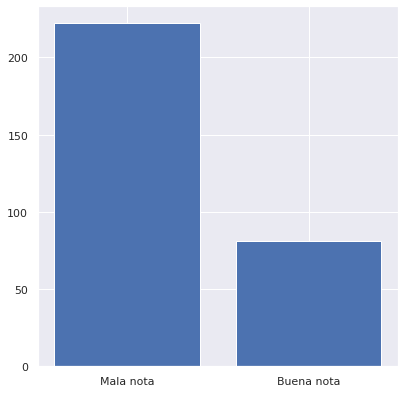

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['Mala nota', 'Buena nota']
students = [(y_train[X_train['absences'] <= 20]  < 13.5).sum(), (y_train[X_train['absences'] <= 20]  >= 13.5).sum()]
ax.bar(langs,students)
plt.show()


En las graficas vemos que el numero de niños que faltan bastantes veces a clase y aprueben o suspenden es bastante equilibrado pero de estos, solo uno ha sacado una nota medianamente alta.

Además, si comparamos a los faltones con los demás estudiantes vemos que la tasa de aprobados es mucho mas alta en los que no faltan tanto.

Por eso, pensamos que estos datos no han sido introduzidos errroneamente y preferimos dejarlos.

### Datos incoherentes

En los graficos anteriores no hemos encontrado datos que sean incorrectos.

### Codificación de variables binarias y nominales

In [ ]:
categorical_variables = X_train.dtypes[student_data.dtypes=='object'].index
categorical_variables

Index(['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob',
       'reason', 'guardian', 'schoolsup', 'famsup', 'paid', 'activities',
       'nursery', 'higher', 'internet', 'romantic'],
      dtype='object')

Como *school* solo puede tomar dos valores, podemos codificar la variable como binaria, es decir, 0-1.

In [ ]:
#print(X_train['school'].value_counts())
X_train['school'][X_train['school'] == 'GP'] = 0
X_train['school'][X_train['school'] == 'MS'] = 1
#print(X_train['school'].value_counts())

Podemos hacer lo mismo con el resto de variables que solo tienen dos valores. Como hemos visto antes, éstas son:


*   school (ya tratada)
*   sex
*   address
*   famsize
*   Pstatus
*   schoolsup
*   famsup
*   paid
*   activities
*   nursery
*   higher
*   internet
*   romantic





In [ ]:
two_value_categorical_variables = ['sex', 'address', 'famsize', 'Pstatus', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']


for tvcv in two_value_categorical_variables:
  vals =  X_train[tvcv].unique()
  X_train[tvcv][X_train[tvcv] == vals[0]] = 0
  X_train[tvcv][X_train[tvcv] == vals[1]] = 1

X_train

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences
386,1,0,18,0,0,0,4,4,teacher,at_home,reputation,mother,3,1,0,0,0,0,0,0,0,0,0,4,4,3,2,2,5,7
99,0,0,16,1,0,0,4,3,other,at_home,course,mother,1,3,0,1,0,0,1,0,0,0,1,5,3,5,1,1,3,0
295,0,1,17,1,0,0,3,3,health,other,home,mother,1,1,0,0,0,0,1,0,0,0,1,4,4,3,1,3,5,4
356,1,0,17,0,0,0,4,4,teacher,services,other,father,2,2,0,0,0,0,0,0,0,0,1,4,3,3,1,2,5,4
159,0,1,16,1,0,0,3,3,other,services,course,father,1,2,1,0,0,0,1,0,0,0,0,4,5,5,4,4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,0,1,17,0,0,0,2,2,services,other,course,mother,4,1,0,0,0,1,1,0,0,0,1,4,4,5,5,5,4,8
22,0,1,16,1,1,0,4,2,teacher,other,course,mother,1,2,0,0,1,1,0,0,0,0,1,4,5,1,1,3,5,2
72,0,0,15,0,0,0,1,1,other,other,reputation,mother,1,2,2,1,0,1,1,1,0,0,0,3,3,4,2,4,5,2
15,0,0,16,1,0,0,4,4,health,other,home,mother,1,1,0,0,0,1,1,0,0,0,1,4,4,4,1,2,2,4


Para el resto de variables categóricas usaremos *one-hot encoding*, ya que en este caso no tiene sentido representarlas como variables numéricas.

In [ ]:
other_categorical_variables = ['Mjob', 'Fjob', 'reason', 'guardian']

X_train_ohe = pd.get_dummies(X_train, columns=other_categorical_variables)
X_train_ohe

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
386,1,0,18,0,0,0,4,4,3,1,0,0,0,0,0,0,0,0,0,4,4,3,2,2,5,7,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0
99,0,0,16,1,0,0,4,3,1,3,0,1,0,0,1,0,0,0,1,5,3,5,1,1,3,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0
295,0,1,17,1,0,0,3,3,1,1,0,0,0,0,1,0,0,0,1,4,4,3,1,3,5,4,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0
356,1,0,17,0,0,0,4,4,2,2,0,0,0,0,0,0,0,0,1,4,3,3,1,2,5,4,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0
159,0,1,16,1,0,0,3,3,1,2,1,0,0,0,1,0,0,0,0,4,5,5,4,4,5,4,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,0,1,17,0,0,0,2,2,4,1,0,0,0,1,1,0,0,0,1,4,4,5,5,5,4,8,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0
22,0,1,16,1,1,0,4,2,1,2,0,0,1,1,0,0,0,0,1,4,5,1,1,3,5,2,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
72,0,0,15,0,0,0,1,1,1,2,2,1,0,1,1,1,0,0,0,3,3,4,2,4,5,2,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
15,0,0,16,1,0,0,4,4,1,1,0,0,0,1,1,0,0,0,1,4,4,4,1,2,2,4,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0


El resto de variables categóricas expresadas numéricamente sí que expresan un orden, así que podemos dejarlas como están, ya que si usaramos *one-hot encoding* estaríamos perdiendo información.

### Eliminación de variables redudantes o irrelevantes


Correlación entre variables numéricas.

Vemos que no parece haber redundancia en los datos. Además, vamos que la correlación entre nuestra variable target 'G3' y el atributo 'absences' es bastante baja. Quizás esto es debido a los outliers que vimos anteriormente, ya que observamos que, aunque los valores fueran muy dispares, afectaban poco al número de aprobados.

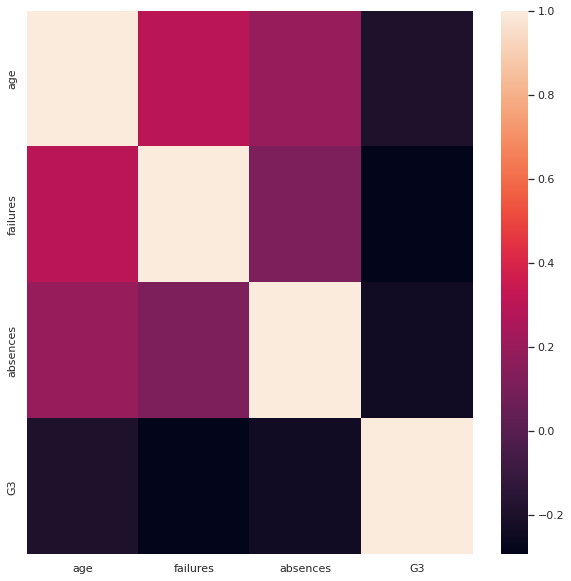

In [ ]:
corr_data = X_train[['age', 'failures', 'absences']].copy()

corr_data['G3'] = y_train

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr_data.corr())
plt.show()

Correlación entre variables categóricas

In [ ]:
categorical_as_numerical_variables = ['Medu', 'Fedu', 'traveltime', 'studytime', 'famrel', 'freetime', 'goout', 'Dalc', 'Walc', 'health']

corr_data = X_train.copy()
corr_data[categorical_as_numerical_variables] = corr_data[categorical_as_numerical_variables].astype(object)

corr_data['G3'] = y_train


corr_data.dtypes

school        object
sex           object
age            int64
address       object
famsize       object
Pstatus       object
Medu          object
Fedu          object
Mjob          object
Fjob          object
reason        object
guardian      object
traveltime    object
studytime     object
failures       int64
schoolsup     object
famsup        object
paid          object
activities    object
nursery       object
higher        object
internet      object
romantic      object
famrel        object
freetime      object
goout         object
Dalc          object
Walc          object
health        object
absences       int64
G3             int64
dtype: object

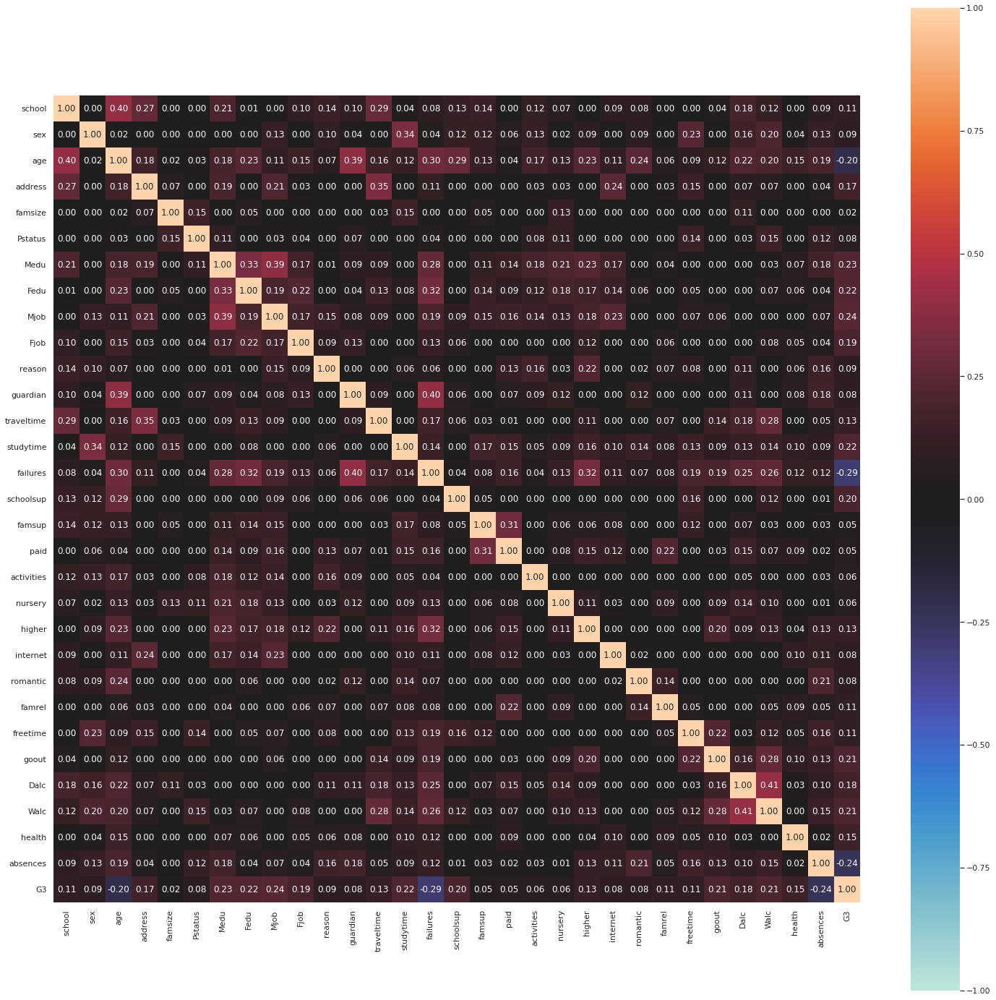

In [ ]:
output = associations(corr_data,nan_strategy='drop_samples',figsize=(25,25))

In [ ]:
correlation = output['corr']
ax = output['ax']

correlation

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G3
school,1.000,0.000,0.405,0.267,0.000e+00,0.000,0.210,0.012,0.000,0.102,0.139,0.101,0.287,0.036,8.313e-02,0.131,0.145,0.000,0.115,0.074,0.000,0.090,0.083,0.000,0.000,0.040,0.183,0.118,0.000,0.093,0.106
sex,0.000,1.000,0.017,0.000,0.000e+00,0.000,0.000,0.000,0.131,0.000,0.102,0.037,0.000,0.343,4.283e-02,0.123,0.123,0.056,0.132,0.016,0.086,0.000,0.093,0.000,0.231,0.000,0.157,0.205,0.039,0.132,0.086
age,0.405,0.017,1.000,0.178,2.289e-02,0.032,0.182,0.234,0.106,0.153,0.071,0.387,0.160,0.120,3.015e-01,0.289,0.128,0.042,0.172,0.133,0.231,0.108,0.243,0.060,0.093,0.116,0.216,0.199,0.153,0.195,-0.197
address,0.267,0.000,0.178,1.000,6.674e-02,0.000,0.192,0.000,0.212,0.034,0.000,0.000,0.350,0.000,1.098e-01,0.000,0.000,0.000,0.032,0.029,0.000,0.245,0.000,0.027,0.145,0.000,0.071,0.069,0.000,0.045,0.165
famsize,0.000,0.000,0.023,0.067,1.000e+00,0.150,0.000,0.055,0.000,0.000,0.000,0.000,0.033,0.150,8.819e-04,0.000,0.054,0.000,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.000,0.112,0.000,0.000,0.003,0.015
Pstatus,0.000,0.000,0.032,0.000,1.503e-01,1.000,0.107,0.000,0.026,0.036,0.000,0.074,0.000,0.000,4.096e-02,0.000,0.000,0.000,0.079,0.110,0.000,0.000,0.000,0.000,0.137,0.000,0.030,0.149,0.000,0.118,0.078
Medu,0.210,0.000,0.182,0.192,0.000e+00,0.107,1.000,0.333,0.387,0.169,0.010,0.090,0.090,0.000,2.752e-01,0.000,0.111,0.138,0.182,0.207,0.230,0.166,0.000,0.043,0.000,0.000,0.000,0.027,0.073,0.180,0.225
Fedu,0.012,0.000,0.234,0.000,5.497e-02,0.000,0.333,1.000,0.194,0.220,0.000,0.043,0.134,0.077,3.192e-01,0.000,0.139,0.094,0.120,0.183,0.171,0.142,0.060,0.000,0.049,0.000,0.000,0.068,0.057,0.042,0.221
Mjob,0.000,0.131,0.106,0.212,0.000e+00,0.026,0.387,0.194,1.000,0.175,0.148,0.078,0.087,0.000,1.902e-01,0.090,0.147,0.155,0.145,0.126,0.181,0.227,0.000,0.000,0.073,0.061,0.000,0.000,0.000,0.073,0.240
Fjob,0.102,0.000,0.153,0.034,0.000e+00,0.036,0.169,0.220,0.175,1.000,0.088,0.130,0.000,0.000,1.312e-01,0.065,0.000,0.000,0.000,0.000,0.116,0.000,0.000,0.059,0.000,0.000,0.000,0.076,0.053,0.041,0.188


Basándonos en la correlación, no parece ser que hayan atributos redundantes, ya que ninguno de ellos muestra una correlación muy alta con algún otro.

### Creación de nuevas variables

No hemos encontrado nada que nos ayude a la creación de variables nuevas.

### Normalización y transformación de variables

De nuestras tres variables numericas nos encontramos que ninguna de ellas sigue una distribución normal. Para conseguirlo procedemos a transformar los datos utilizando una función logaritmica o un boxcox. 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f23ddcf8550>,
      dtype=object)

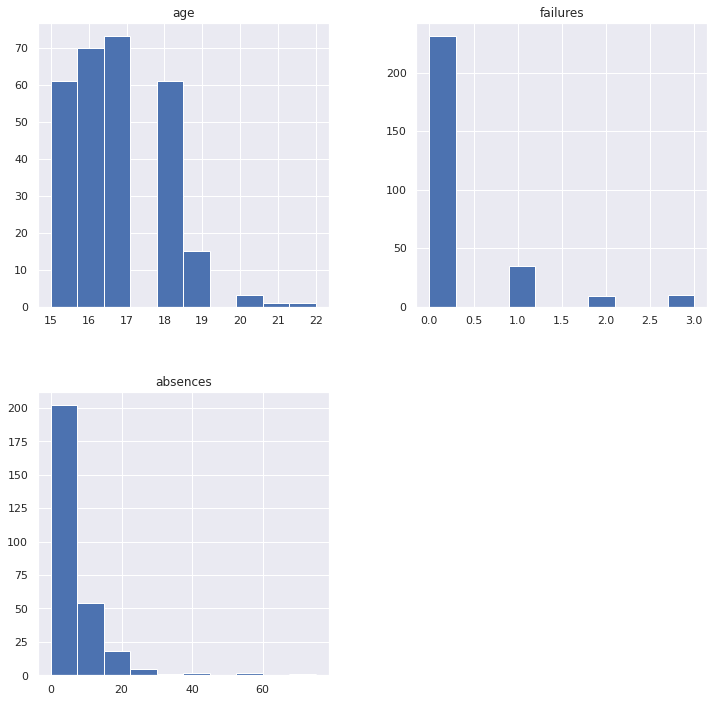

In [ ]:
X_train[['age', 'failures', 'absences']].hist(figsize=(12,12), layout=(2,2))

En en caso de age nos parece que la transformación logaritmica tiene una forma mas gaussiana.

Text(0.5, 0.98, 'Log vs Boxcox en la variable age')

(array([61., 70.,  0., 73., 61.,  0., 15.,  3.,  1.,  1.]),
 array([1.17638069, 1.19300463, 1.20962856, 1.2262525 , 1.24287643,
        1.25950037, 1.2761243 , 1.29274824, 1.30937217, 1.32599611,
        1.34262004]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Log transformation')

(array([61.,  0., 70.,  0., 73., 61., 15.,  0.,  3.,  2.]),
 array([0.57111606, 0.57137053, 0.571625  , 0.57187947, 0.57213394,
        0.57238841, 0.57264288, 0.57289734, 0.57315181, 0.57340628,
        0.57366075]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Boxcox transformation')

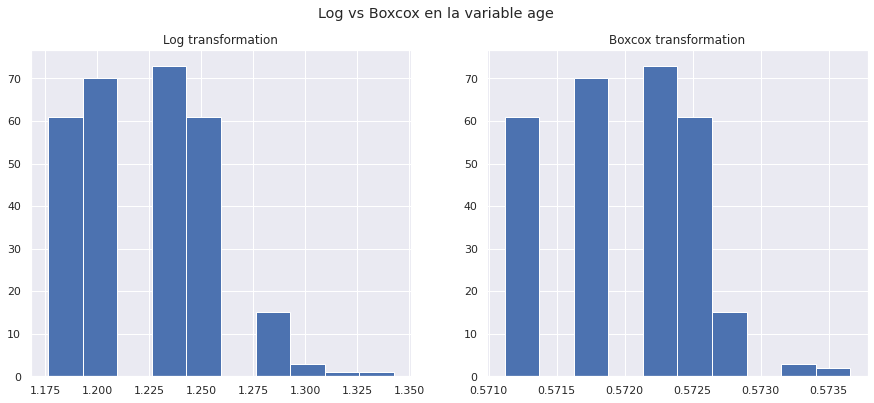

In [ ]:
my_log = lambda x: np.log10(x+0.01)

X_log = X_train['age'].apply(my_log)

X_boxcox, _ = boxcox(X_train['age'] + 0.01)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Log vs Boxcox en la variable age')
ax1.hist(X_log)
ax1.set_title('Log transformation')
ax2.hist(X_boxcox)
ax2.set_title('Boxcox transformation')

En en caso de failures acabamos eligiendo la transformación logaritmica. 

Text(0.5, 0.98, 'Log vs Boxcox en la variable failures')

(array([231.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  35.,  19.]),
 array([-2.        , -1.75214335, -1.5042867 , -1.25643005, -1.0085734 ,
        -0.76071675, -0.5128601 , -0.26500345, -0.0171468 ,  0.23070985,
         0.4785665 ]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Log transformation')

(array([231.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  54.]),
 array([-112.43534293, -101.12606677,  -89.81679061,  -78.50751446,
         -67.1982383 ,  -55.88896214,  -44.57968598,  -33.27040982,
         -21.96113366,  -10.65185751,    0.65741865]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Boxcox transformation')

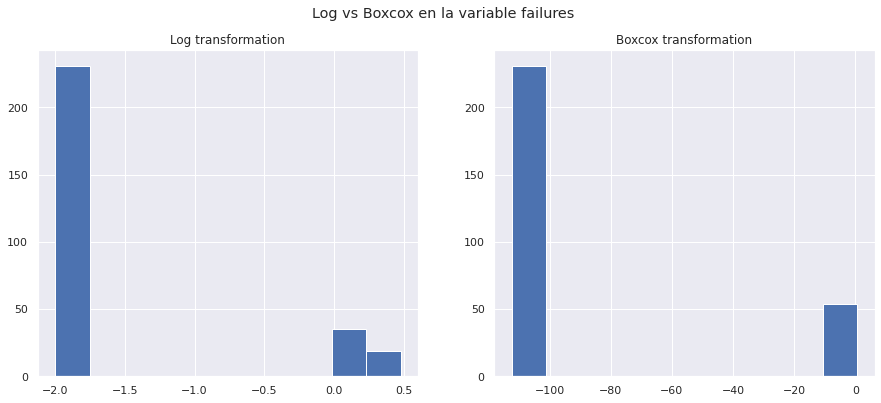

In [ ]:
my_log = lambda x: np.log10(x+0.01)

X_log = X_train['failures'].apply(my_log)

X_boxcox, _ = boxcox(X_train['failures'] + 0.01)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Log vs Boxcox en la variable failures')
ax1.hist(X_log)
ax1.set_title('Log transformation')
ax2.hist(X_boxcox)
ax2.set_title('Boxcox transformation')

En en caso de abscences las dos transformaciones son muy parecidas así que para simplificar hemos elegido la logaritmica.

Text(0.5, 0.98, 'Log vs Boxcox en la variable absences')

(array([57.,  0.,  0.,  0.,  0., 59., 55., 75., 34.,  5.]),
 array([-2.        , -1.61248808, -1.22497617, -0.83746425, -0.44995233,
        -0.06244042,  0.3250715 ,  0.71258342,  1.10009533,  1.48760725,
         1.87511917]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Log transformation')

(array([57.,  0., 59., 51., 52., 40., 17.,  4.,  2.,  3.]),
 array([-2.55186138, -1.44051845, -0.32917552,  0.78216741,  1.89351034,
         3.00485327,  4.1161962 ,  5.22753914,  6.33888207,  7.450225  ,
         8.56156793]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Boxcox transformation')

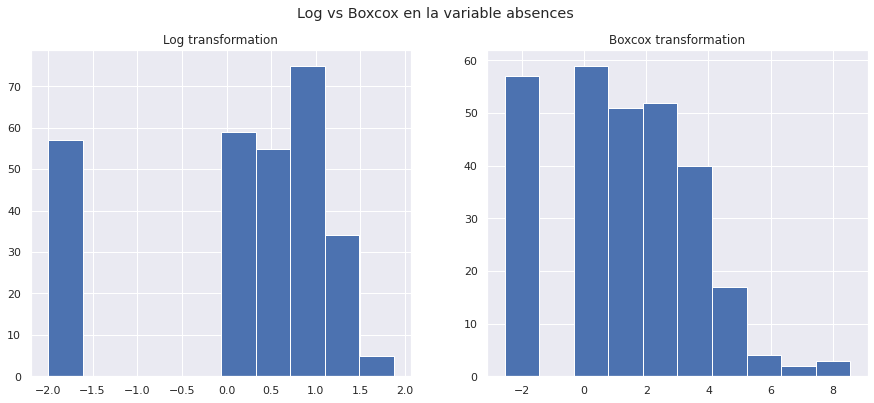

In [ ]:
my_log = lambda x: np.log10(x+0.01)

X_log = X_train['absences'].apply(my_log)

X_boxcox, _ = boxcox(X_train['absences'] + 0.01)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Log vs Boxcox en la variable absences')
ax1.hist(X_log)
ax1.set_title('Log transformation')
ax2.hist(X_boxcox)
ax2.set_title('Boxcox transformation')

## Selección del modelo

### Linear Regression

Vamos a usar un modelo de Linear Regression como base para empezar a trabajar.

In [ ]:
def lr_preprocessing(X, y):
  two_value_categorical_variables = ['school', 'sex', 'address', 'famsize', 'Pstatus', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']
    
  for tvcv in two_value_categorical_variables:
    vals =  X[tvcv].unique()
    X[tvcv][X[tvcv] == vals[0]] = 0
    X[tvcv][X[tvcv] == vals[1]] = 1

  other_categorical_variables = ['Mjob', 'Fjob', 'reason', 'guardian']
  X = pd.get_dummies(X, columns=other_categorical_variables)

  #X = X.drop(columns=other_categorical_variables)
  scaler = MinMaxScaler()
  my_log = lambda x: np.log10(x+0.01)
  X['age'] = X['age'].apply(my_log)
  X['age'] = scaler.fit_transform(X[['age']])
  X['failures'] = X['failures'].apply(my_log)
  X['failures'] = scaler.fit_transform(X[['failures']])
  X['absences'] = X['absences'].apply(my_log)
  X['absences'] = scaler.fit_transform(X[['absences']])
  

  categorical_as_numerical_variables = ['Medu', 'Fedu', 'traveltime', 'studytime', 'famrel', 'freetime', 'goout', 'Dalc', 'Walc', 'health']
 
  for canv in categorical_as_numerical_variables:
    X[[canv]] = scaler.fit_transform(X[[canv]])

  return X, y
  

In [ ]:
X_train_lr, _ = lr_preprocessing(X_train, y_train)
X_train_lr

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
278,0,0,0.476,0,0,0,1.00,1.00,0.0,0.333,0.809,0,0,0,0,0,0,0,0,0.25,0.75,0.75,0.00,0.00,0.75,0.820,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0
203,0,0,0.327,1,0,0,0.50,0.50,0.0,0.000,0.000,1,0,0,1,0,0,0,1,1.00,0.50,0.25,0.00,0.25,0.50,0.840,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
339,0,0,0.327,1,0,1,0.75,0.50,0.0,0.333,0.000,1,0,1,1,0,0,0,1,0.75,0.50,0.50,0.25,0.50,0.25,0.672,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0.000,0,0,0,1.00,0.50,0.0,0.667,0.000,1,0,1,0,0,0,0,0,0.50,0.25,0.25,0.00,0.00,1.00,0.594,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0
262,0,1,0.476,1,0,0,0.75,0.50,0.0,0.667,0.000,1,1,0,0,1,0,1,1,1.00,0.50,0.25,0.00,0.00,0.50,0.517,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299,0,1,0.476,0,1,0,1.00,1.00,0.0,0.000,0.000,1,0,1,1,0,0,0,0,0.00,0.75,0.25,0.25,0.25,0.00,0.697,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0
22,0,1,0.168,0,1,0,1.00,0.50,0.0,0.333,0.000,1,1,0,0,0,0,0,1,0.75,1.00,0.00,0.00,0.50,1.00,0.594,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
72,0,0,0.000,1,0,0,0.25,0.25,0.0,0.333,0.929,0,0,0,1,1,0,0,0,0.50,0.50,0.75,0.25,0.75,1.00,0.594,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
15,0,0,0.168,0,0,0,1.00,1.00,0.0,0.000,0.000,1,0,0,1,0,0,0,1,0.75,0.75,0.75,0.00,0.25,0.25,0.672,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0


In [ ]:
t0= time.process_time()
lr = LinearRegression().fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

Time elapsed:  0.014270092999999928


In [ ]:
cv = cross_val_score(lr, X_train_lr, y_train, cv=5, scoring='r2')
print()
print('Cross validation:', cv, 'R2 score mean:',np.mean(cv))


Cross validation: [ 0.1104073   0.13098371  0.06843913 -0.12647277  0.13645522] R2 score mean: 0.06396251674819979


In [ ]:
predictions = lr.predict(X_train_lr)

Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

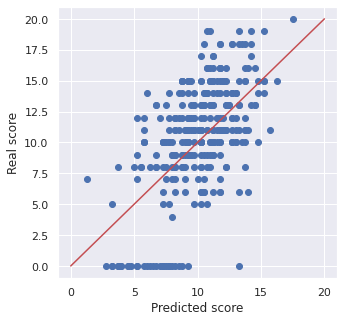

In [ ]:
plt.rcParams["figure.figsize"] = (5,5)
plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 3., 14., 29., 57., 62., 75., 54., 19.,  2.,  1.]),
 array([ 2.63867188,  4.26621094,  5.89375   ,  7.52128906,  9.14882812,
        10.77636719, 12.40390625, 14.03144531, 15.65898437, 17.28652344,
        18.9140625 ]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

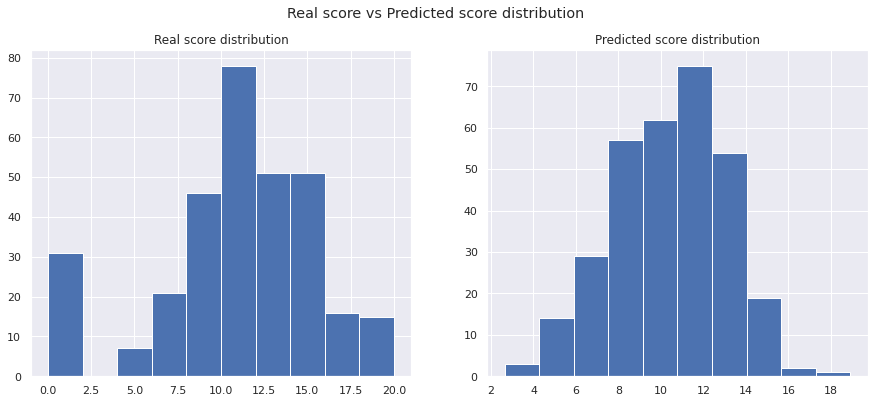

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
lr.coef_

array([ 1.36435606e+00,  1.42220317e+00, -3.81763551e+00,  6.16026377e-01,
       -1.79866434e+00,  2.32695210e+00, -4.15118442e+00,  1.22377827e+00,
        1.19432470e+00,  1.71170945e+00,  9.72213890e-01, -2.74077570e+00,
        4.20057513e+00, -4.08743721e+12, -4.08743721e+12, -4.08743721e+12,
       -4.08743721e+12, -4.08743721e+12, -4.33172062e+12, -4.33172062e+12,
       -4.33172062e+12, -4.33172062e+12, -4.33172062e+12,  3.65651625e+11,
        3.65651625e+11,  3.65651625e+11,  3.65651625e+11, -1.77039873e+12,
       -1.77039873e+12, -1.77039873e+12])

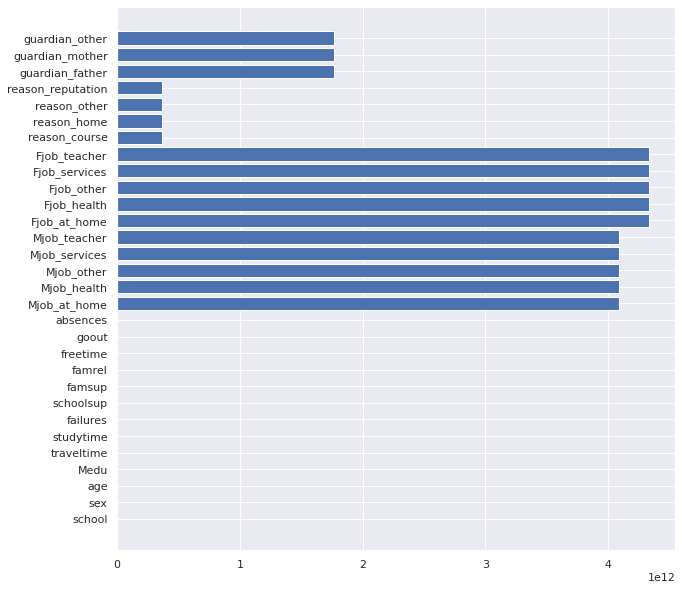

In [ ]:
height = abs(lr.coef_)
bars = X_train_lr.columns
y_pos = np.arange(len(bars))
plt.rcParams["figure.figsize"] = (10,10)
_=plt.barh(y_pos, height)
 
_=plt.yticks(y_pos, bars)

_=plt.show()

Los pesos son extremadamente grandes en algunas variables. En concreto, en aquellas variables a las que le hemos hecho one hot encoding.

Vamos a probar a ejecutar el mismo modelo pero esta vez usando regularización. 

In [ ]:
X_train_lr, _ = lr_preprocessing(X_train, y_train)

t0= time.process_time()
lr = LinearRegression(normalize=True).fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1)

cv = cross_val_score(lr, X_train_lr, y_train, cv=5, scoring='r2')
print()
print('Cross validation:', cv, 'R2 score mean:',np.mean(cv))

predictions = lr.predict(X_train_lr)

Time elapsed:  0.006901471000020365

Cross validation: [ 0.11119959  0.08130246  0.0685123  -0.12603658  0.13963366] R2 score mean: 0.05492228499081209


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

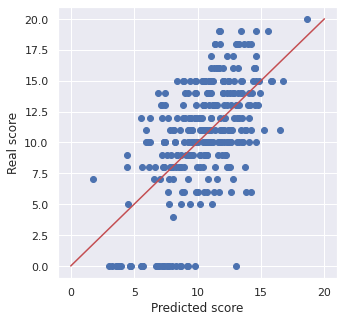

In [ ]:
plt.rcParams["figure.figsize"] = (5,5)
plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 3., 10., 16., 47., 61., 76., 68., 29.,  5.,  1.]),
 array([ 1.78125,  3.4625 ,  5.14375,  6.825  ,  8.50625, 10.1875 ,
        11.86875, 13.55   , 15.23125, 16.9125 , 18.59375]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

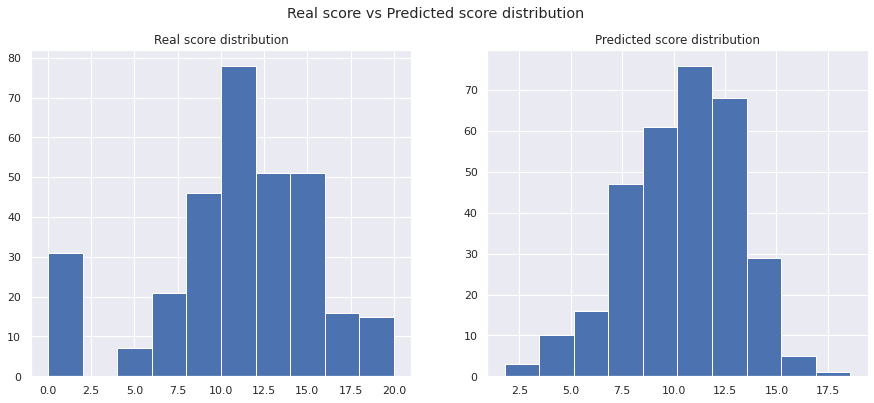

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

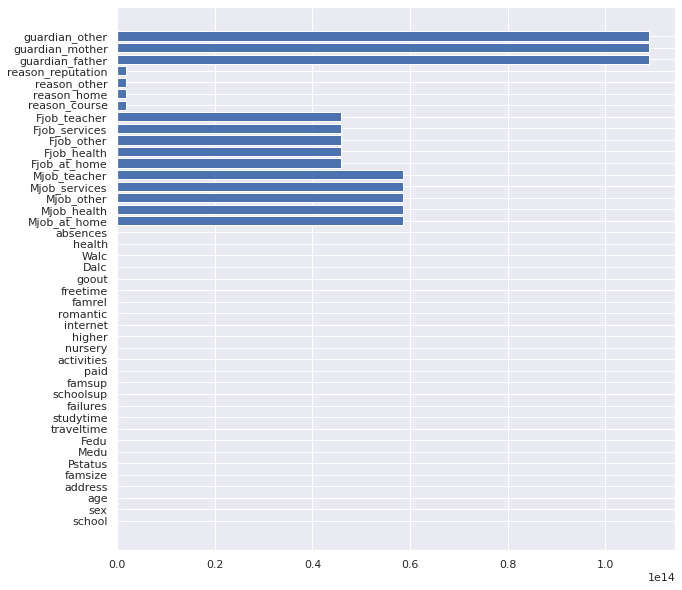

In [ ]:
height = abs(lr.coef_)
bars = X_train_lr.columns
y_pos = np.arange(len(bars))
plt.rcParams["figure.figsize"] = (10,10)
_=plt.barh(y_pos, height)
 
_=plt.yticks(y_pos, bars)

_=plt.show()

Aunque vemos que aplicar a la normalización ha ayudado a reducir un poco el valor de los pesos, siguen siendo insolitamente grande.
Por tanto, vamos a intentar entrenar el modelo sin las variables de one hot encoding. Además, vamos a eliminar todas las columnas que están tan desbalanceadas que carecen de sentido usarlas.

In [ ]:
X_train_lr, _ = lr_preprocessing(X_train, y_train)

In [ ]:
X_train_lr = X_train_lr.drop(columns=['Mjob_at_home','Mjob_health','Mjob_other','Mjob_services','Mjob_teacher','Fjob_at_home','Fjob_health','Fjob_other','Fjob_services','Fjob_teacher','reason_course','reason_home','reason_other','reason_reputation','guardian_father','guardian_mother','guardian_other', 'school', 'Pstatus', 'schoolsup', 'higher', 'internet', 'nursery', 'romantic', 'address'])

Time elapsed:  0.0049841500000127326
Cross validation: [0.24610693 0.28018575 0.12462196 0.12262376 0.25982689] R2 score mean: 0.20667305981733977


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

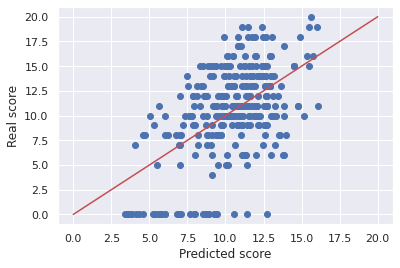

In [ ]:
t0= time.process_time()
lr = LinearRegression(normalize=True).fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1)

cv = cross_val_score(lr, X_train_lr, y_train, cv=5, scoring='r2')

print('Cross validation:', cv, 'R2 score mean:',np.mean(cv))
predictions = lr.predict(X_train_lr)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Viendo el gráfico vemos que el modelo tiene problemas para predecir las notas que son 0. Creemos que estas notas pueden ser debidas a causas que no salen reflejadas en los datos o que un modelo tan simple como el que estamos usando no es capaz de deducir.

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([10., 10., 16., 24., 46., 68., 69., 51., 13.,  9.]),
 array([ 3.37870959,  4.64883627,  5.91896294,  7.18908962,  8.4592163 ,
         9.72934298, 10.99946966, 12.26959634, 13.53972301, 14.80984969,
        16.07997637]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

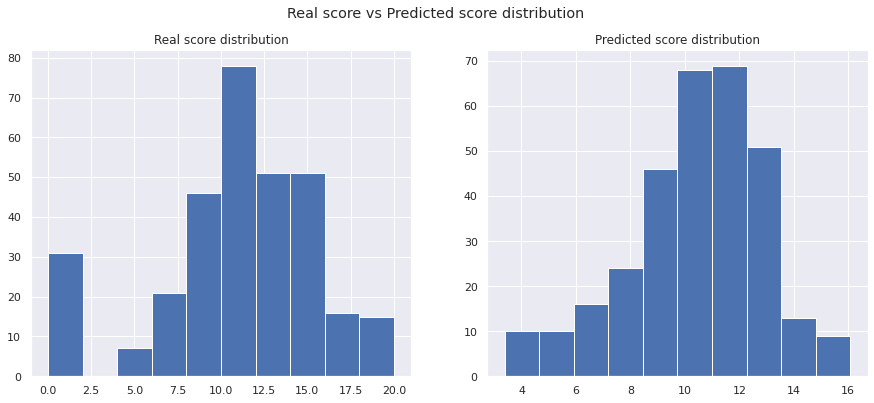

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

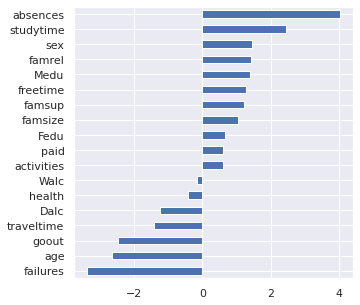

In [ ]:
height =lr.coef_
bars = X_train_lr.columns

coef = Series(height, bars).sort_values()

coef.plot.barh()

Tras ejecutar el modelo sin las variables codificadas con one hot encoding y eliminando variables desbalanceadas, conseguimos un mejor score. Aun así, sigue siendo un score demasiado bajo.

Vemos que algunos pesos no tienen sentido. Por ejemplo, parece que el número de absencias tiene un peso positivo en la nota del alumno. Eso puede ser debido a que los outliers tienen demasiada influencia en nuestro modelo.

In [ ]:
X_train_lr, _ = lr_preprocessing(X_train, y_train)
X_train_lr = X_train_lr.drop(columns=['absences','Mjob_at_home','Mjob_health','Mjob_other','Mjob_services','Mjob_teacher','Fjob_at_home','Fjob_health','Fjob_other','Fjob_services','Fjob_teacher','reason_course','reason_home','reason_other','reason_reputation','guardian_father','guardian_mother','guardian_other', 'school', 'Pstatus', 'schoolsup', 'higher', 'internet', 'nursery', 'romantic', 'address'])

In [ ]:
t0= time.process_time()
lr = LinearRegression(normalize=True).fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1)

cv = cross_val_score(lr, X_train_lr, y_train, cv=5, scoring='r2')

print('Cross validation:', cv, 'R2 score mean:',np.mean(cv))

Time elapsed:  0.004881275000002461
Cross validation: [0.0520965  0.20594291 0.06062701 0.04020049 0.23735207] R2 score mean: 0.11924379531213099


El resultado de quitar esto ha sido mucho peor así que finalmente decidimos mantenerla de ahora en adelante.

In [ ]:
def lr_preprocessingNoOHE(X, y):
  two_value_categorical_variables = ['school', 'sex', 'address', 'famsize', 'Pstatus', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']
    
  for tvcv in two_value_categorical_variables:
    vals =  X[tvcv].unique()
    X[tvcv][X[tvcv] == vals[0]] = 0
    X[tvcv][X[tvcv] == vals[1]] = 1

  other_categorical_variables = ['Mjob', 'Fjob', 'reason', 'guardian']
  X = pd.get_dummies(X, columns=other_categorical_variables)

  #X = X.drop(columns=other_categorical_variables)
  scaler = MinMaxScaler()
  my_log = lambda x: np.log10(x+0.01)
  X['age'] = X['age'].apply(my_log)
  X['age'] = scaler.fit_transform(X[['age']])
  X['failures'] = X['failures'].apply(my_log)
  X['failures'] = scaler.fit_transform(X[['failures']])
  X['absences'] = X['absences'].apply(my_log)
  X['absences'] = scaler.fit_transform(X[['absences']])
  

  categorical_as_numerical_variables = ['Medu', 'Fedu', 'traveltime', 'studytime', 'famrel', 'freetime', 'goout', 'Dalc', 'Walc', 'health']
 
  for canv in categorical_as_numerical_variables:
    X[[canv]] = scaler.fit_transform(X[[canv]])

  X = X.drop(columns=['Mjob_at_home','Mjob_health','Mjob_other','Mjob_services','Mjob_teacher','Fjob_at_home','Fjob_health','Fjob_other','Fjob_services','Fjob_teacher','reason_course','reason_home','reason_other','reason_reputation','guardian_father','guardian_mother','guardian_other', 'school', 'Pstatus', 'schoolsup', 'higher', 'internet', 'nursery', 'romantic', 'address'])
  
  return X, y
  

### LASSO

Con intención de intentar regularizar vamos a usar LASSO. 

Usaremos los mismos dos preprocesados que en Regresión lineal.

In [ ]:
X_train_lr, y_train_lr = lr_preprocessing(X_train, y_train)

In [ ]:
parameters = {'alpha': np.linspace(0, 0.2, 21)}

clf = GridSearchCV(Lasso(normalize=True), parameters, n_jobs=-1, verbose=10, cv=5, scoring='r2')
clf.fit(X_train_lr,y_train)

lasso = clf.best_estimator_

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5, estimator=Lasso(normalize=True), n_jobs=-1,
             param_grid={'alpha': array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 ])},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(lasso, X_train_lr, y_train, n_jobs=-1, cv=5, verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))


Best params: {'alpha': 0.01} Cross validation: [0.11808999 0.19862827 0.10625136 0.05495349 0.22816006] R2 score mean: 0.1412166344451237


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished


In [ ]:
t0= time.process_time()
lasso.fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

Lasso(alpha=0.01, normalize=True)

Time elapsed:  0.017800806999986207


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

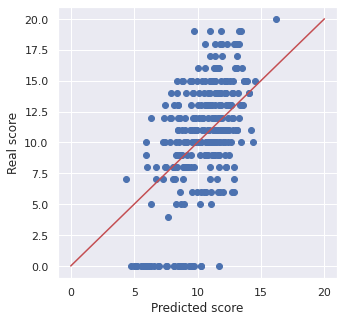

In [ ]:
predictions = lasso.predict(X_train_lr)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Como vemos el modelo sigue siendo incapaz de adaptarse a aquellos casos en los que la nota es 0.

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 5., 15., 15., 49., 52., 75., 64., 34.,  6.,  1.]),
 array([ 4.37307028,  5.55516928,  6.73726827,  7.91936726,  9.10146625,
        10.28356524, 11.46566424, 12.64776323, 13.82986222, 15.01196121,
        16.19406021]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

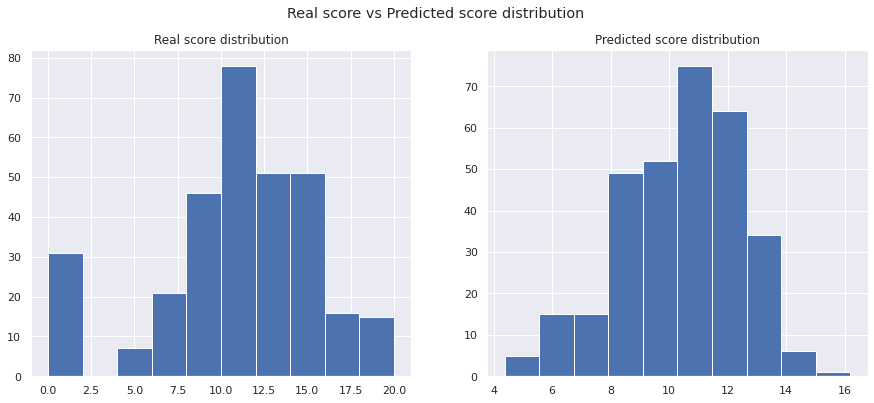

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

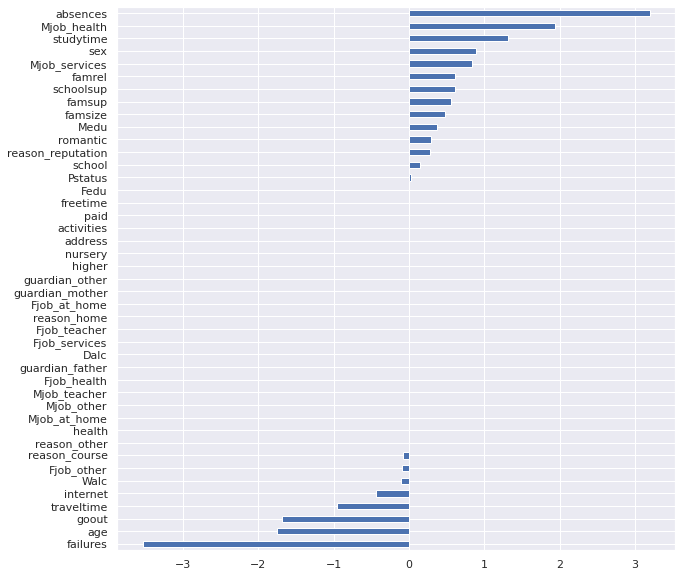

In [ ]:
plt.rcParams["figure.figsize"] = (10,10)
height = lasso.coef_
bars = X_train_lr.columns

coef = Series(height, bars).sort_values()

coef.plot.barh()

En este caso aunque no hemos modificado las variables codificadas como one-hot encoding manualmente, LASSO ha sido capaz de regularizarlas. De todas formas, el resultado ha sido algo peor que en la regresión lineal. Así que vamos a probar a hacerlo.

In [ ]:
X_train_lr, y_train_lr = lr_preprocessingNoOHE(X_train, y_train)

In [ ]:
parameters = {'alpha': np.linspace(0, 0.2, 21)}

clf = GridSearchCV(Lasso(normalize=True), parameters, n_jobs=-1, verbose=10, cv=5, scoring='r2')
clf.fit(X_train_lr,y_train)

lasso = clf.best_estimator_

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5, estimator=Lasso(normalize=True), n_jobs=-1,
             param_grid={'alpha': array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 ])},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(lasso, X_train_lr, y_train, n_jobs=-1, cv=5, verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))


Best params: {'alpha': 0.0} Cross validation: [0.24610693 0.28018575 0.12462196 0.12262376 0.25982689] R2 score mean: 0.2066730598173394


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished


In [ ]:
t0= time.process_time()
lasso.fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

Lasso(alpha=0.0, normalize=True)

Time elapsed:  0.015379893999977412


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

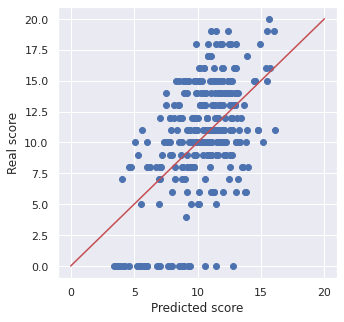

In [ ]:
plt.rcParams["figure.figsize"] = (5,5)
predictions = lasso.predict(X_train_lr)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([10., 10., 16., 24., 46., 68., 69., 51., 13.,  9.]),
 array([ 3.37870959,  4.64883627,  5.91896294,  7.18908962,  8.4592163 ,
         9.72934298, 10.99946966, 12.26959634, 13.53972301, 14.80984969,
        16.07997637]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

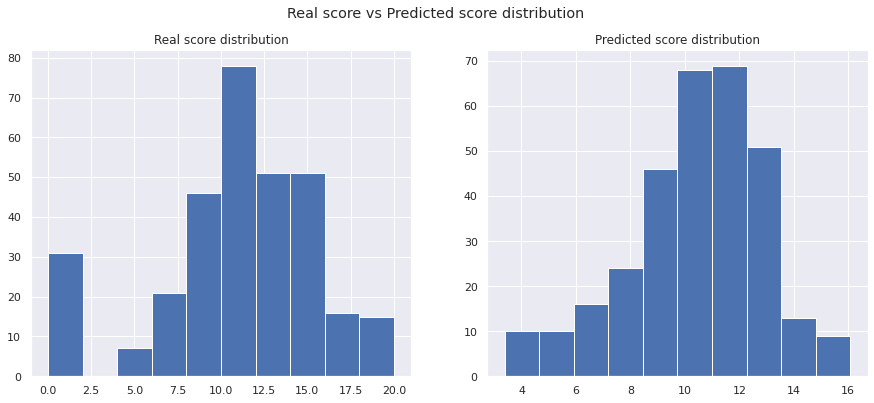

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

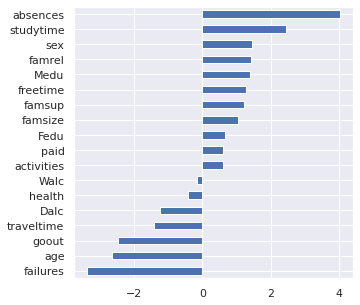

In [ ]:
plt.rcParams["figure.figsize"] = (5,5)
height = lasso.coef_
bars = X_train_lr.columns

coef = Series(height, bars).sort_values()

coef.plot.barh()

### Quadratic SVM

Con la intención de probar con un modelo más complejo que sea capaz de adaptarse a aquellos casos en que la nota es 0 hemos decidio usar quadratic SVM.

In [ ]:
X_train_lr, _ = lr_preprocessing(X_train, y_train)

In [ ]:
parameters = {'degree': [1,2,3], 'epsilon':[0,0.1,0.5,1,3,5,7,8,9,10], 'gamma':['scale', 'auto'], 'C': [0,1e-2,0.1, 0.5,1,5,10,15,20,50,100,200,500]}

clf = GridSearchCV(SVR(kernel='poly'), parameters, n_jobs=-1, verbose=10, cv=5, scoring='r2')
clf.fit(X_train_lr, y_train)

svr = clf.best_estimator_

Fitting 5 folds for each of 780 candidates, totalling 3900 fits


GridSearchCV(cv=5, estimator=SVR(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0, 0.01, 0.1, 0.5, 1, 5, 10, 15, 20, 50, 100,
                               200, 500],
                         'degree': [1, 2, 3],
                         'epsilon': [0, 0.1, 0.5, 1, 3, 5, 7, 8, 9, 10],
                         'gamma': ['scale', 'auto']},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(svr, X_train_lr, y_train, n_jobs=-1, cv=5, verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))


Best params: {'C': 20, 'degree': 1, 'epsilon': 5, 'gamma': 'auto'} Cross validation: [ 0.21866261  0.12121621  0.10632173 -0.00137139  0.24098858] R2 score mean: 0.13716354767621772


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished


In [ ]:
t0= time.process_time()
svr.fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

SVR(C=20, degree=1, epsilon=5, gamma='auto', kernel='poly')

Time elapsed:  0.014302814999999747


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

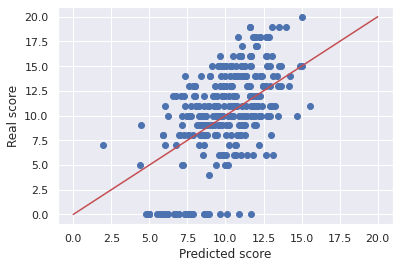

In [ ]:
predictions = svr.predict(X_train_lr)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 1.,  2., 12., 25., 47., 69., 74., 58., 21.,  7.]),
 array([ 1.9821132 ,  3.33674117,  4.69136914,  6.04599711,  7.40062509,
         8.75525306, 10.10988103, 11.464509  , 12.81913698, 14.17376495,
        15.52839292]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

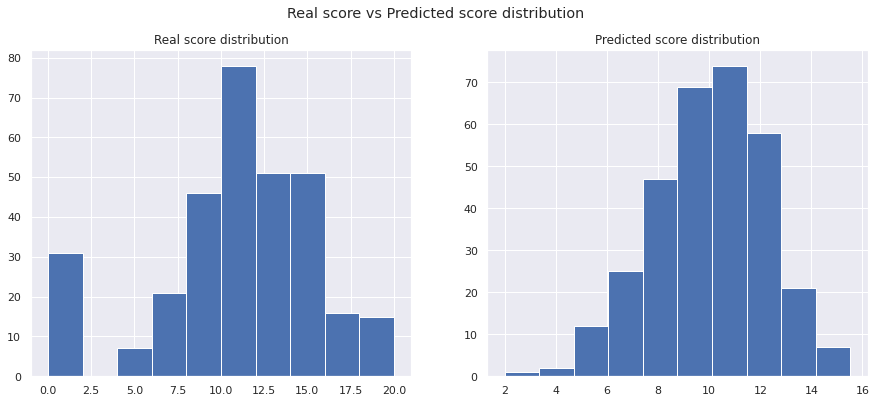

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
mydata = X_train_lr.join(y_train)
mydata

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,G3
278,0,0,0.476,0,0,0,1.00,1.00,0.0,0.333,0.809,0,0,0,0,0,0,0,0,0.25,0.75,0.75,0.00,0.00,0.75,0.820,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,8
203,0,0,0.327,1,0,0,0.50,0.50,0.0,0.000,0.000,1,0,0,1,0,0,0,1,1.00,0.50,0.25,0.00,0.25,0.50,0.840,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,6
339,0,0,0.327,1,0,1,0.75,0.50,0.0,0.333,0.000,1,0,1,1,0,0,0,1,0.75,0.50,0.50,0.25,0.50,0.25,0.672,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,10
3,0,0,0.000,0,0,0,1.00,0.50,0.0,0.667,0.000,1,0,1,0,0,0,0,0,0.50,0.25,0.25,0.00,0.00,1.00,0.594,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,15
262,0,1,0.476,1,0,0,0.75,0.50,0.0,0.667,0.000,1,1,0,0,1,0,1,1,1.00,0.50,0.25,0.00,0.00,0.50,0.517,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299,0,1,0.476,0,1,0,1.00,1.00,0.0,0.000,0.000,1,0,1,1,0,0,0,0,0.00,0.75,0.25,0.25,0.25,0.00,0.697,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,16
22,0,1,0.168,0,1,0,1.00,0.50,0.0,0.333,0.000,1,1,0,0,0,0,0,1,0.75,1.00,0.00,0.00,0.50,1.00,0.594,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,16
72,0,0,0.000,1,0,0,0.25,0.25,0.0,0.333,0.929,0,0,0,1,1,0,0,0,0.50,0.50,0.75,0.25,0.75,1.00,0.594,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,5
15,0,0,0.168,0,0,0,1.00,1.00,0.0,0.000,0.000,1,0,0,1,0,0,0,1,0.75,0.75,0.75,0.00,0.25,0.25,0.672,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,14


In [ ]:
i = 0
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.iloc[i],
    svr.predict, 
    num_features=10
)

Intercept 11.770090808976027
Prediction_local [8.3708929]
Right: 9.462942981950015


In [ ]:
exp.show_in_notebook(show_table=True)

Al usar el model cuadrático conseguimos un score un poco peor que al del LASSO.

In [ ]:
X_train_lr, _ = lr_preprocessingNoOHE(X_train, y_train)

In [ ]:
parameters = {'degree': [1,2,3], 'epsilon':[0,0.1,0.5,1,3,5,7,8,9,10], 'gamma':['scale', 'auto'], 'C': [0,1e-2,0.1, 0.5,1,5,10,15,20,50,100,200,500]}

clf = GridSearchCV(SVR(kernel='poly'), parameters, n_jobs=-1, verbose=10, cv=5, scoring='r2')
clf.fit(X_train_lr, y_train)

svr = clf.best_estimator_

Fitting 5 folds for each of 780 candidates, totalling 3900 fits


GridSearchCV(cv=5, estimator=SVR(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0, 0.01, 0.1, 0.5, 1, 5, 10, 15, 20, 50, 100,
                               200, 500],
                         'degree': [1, 2, 3],
                         'epsilon': [0, 0.1, 0.5, 1, 3, 5, 7, 8, 9, 10],
                         'gamma': ['scale', 'auto']},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(svr, X_train_lr, y_train, n_jobs=-1, cv=5, verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))


Best params: {'C': 10, 'degree': 1, 'epsilon': 5, 'gamma': 'auto'} Cross validation: [0.23131093 0.29412003 0.13068914 0.12991493 0.29556644] R2 score mean: 0.21632029319681906


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished


In [ ]:
t0= time.process_time()
svr.fit(X_train_lr, y_train)
t1 = time.process_time() - t0

print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

SVR(C=10, degree=1, epsilon=5, gamma='auto', kernel='poly')

Time elapsed:  0.011279271000006474


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

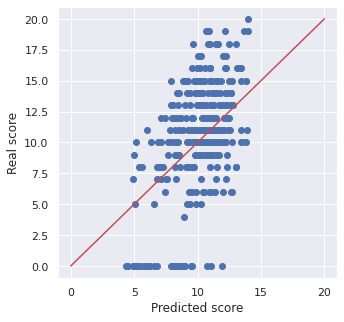

In [ ]:
predictions = svr.predict(X_train_lr)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([12.,  7., 15., 19., 38., 53., 67., 56., 35., 14.]),
 array([ 4.33850941,  5.3047047 ,  6.2709    ,  7.2370953 ,  8.2032906 ,
         9.16948589, 10.13568119, 11.10187649, 12.06807178, 13.03426708,
        14.00046238]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

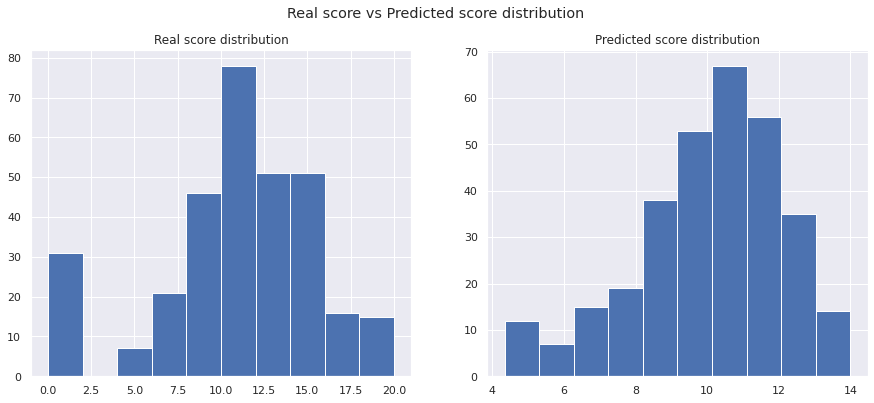

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
mydata = X_train_lr.join(y_train)
mydata

,sex,age,famsize,Medu,Fedu,traveltime,studytime,failures,famsup,paid,activities,famrel,freetime,goout,Dalc,Walc,health,absences,G3
278,0,0.476,0,1.00,1.00,0.0,0.333,0.809,0,0,0,0.25,0.75,0.75,0.00,0.00,0.75,0.820,8
203,0,0.327,0,0.50,0.50,0.0,0.000,0.000,0,0,1,1.00,0.50,0.25,0.00,0.25,0.50,0.840,6
339,0,0.327,0,0.75,0.50,0.0,0.333,0.000,0,1,1,0.75,0.50,0.50,0.25,0.50,0.25,0.672,10
3,0,0.000,0,1.00,0.50,0.0,0.667,0.000,0,1,0,0.50,0.25,0.25,0.00,0.00,1.00,0.594,15
262,1,0.476,0,0.75,0.50,0.0,0.667,0.000,1,0,0,1.00,0.50,0.25,0.00,0.00,0.50,0.517,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299,1,0.476,1,1.00,1.00,0.0,0.000,0.000,0,1,1,0.00,0.75,0.25,0.25,0.25,0.00,0.697,16
22,1,0.168,1,1.00,0.50,0.0,0.333,0.000,1,0,0,0.75,1.00,0.00,0.00,0.50,1.00,0.594,16
72,0,0.000,0,0.25,0.25,0.0,0.333,0.929,0,0,1,0.50,0.50,0.75,0.25,0.75,1.00,0.594,5
15,0,0.168,0,1.00,1.00,0.0,0.000,0.000,0,0,1,0.75,0.75,0.75,0.00,0.25,0.25,0.672,14


Caso habitual:

In [ ]:
i = 9
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.iloc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 6.804641203946089
Prediction_local [12.30809106]
Right: 12.083164051033922


Caso con muchas ausencias:

In [ ]:
i = 276
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.loc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 8.984826745844252
Prediction_local [10.99469348]
Right: 11.67901143714691


Su nota real es un 0:

In [ ]:
i = 259
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.loc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 7.615707265248356
Prediction_local [11.14735379]
Right: 11.965033134717618


Su nota real es un 0:

In [ ]:
i = 128
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.loc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 12.650242743770619
Prediction_local [5.07022583]
Right: 4.873906146284389


Con este pre-processing y modelo estamos consiguiendo un score más alto.

La importancia de algunas variables ha cambiado respecto a la regresión lineal y al LASSO. En la svm, Traveltime y Walc son atributos positivos al momento de obtener buena nota y en cambio, en los otros dos modelos son negativos. Esto se puede deber a que con lime estamos calculando la importancia de los datos respecto a un caso particular (i = 0).  

### MLP


Dado que los resultados de los modelos lineales no ha dado buen resultado, quizás es porque es necesario usar un modelo no lineal. Por ello, primero vamos a probar con una Multi-Layer Perceptron model.

In [ ]:
X_train_mlp, _ = lr_preprocessing(X_train, y_train)

In [ ]:
t0= time.process_time()
mlpr = MLPRegressor(hidden_layer_sizes = (800,400,200), verbose=True)
cv =  cross_val_score(mlpr, X_train_mlp, y_train, n_jobs=-1, verbose=3, cv=3)
t1 = time.process_time() - t0
print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time elapsed:  0.18786059199999272


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   24.8s finished


In [ ]:
parameters = {
    'hidden_layer_sizes': [(100, 50), (400,200),(1000,500),(200, 400, 200) ,(800,400,200)], 
    'activation': ['tanh', 'relu'],
    'solver': ['lbfgs', 'adam'],
    'alpha': [1e-2, 0.1],
    'learning_rate_init': [1e-2, 0.1]
    }


clf = GridSearchCV(MLPRegressor(verbose=True), parameters, n_jobs=-1,verbose=10, cv=5, scoring='r2')
clf.fit(X_train_mlp, y_train)

mlpr = clf.best_estimator_

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Iteration 1, loss = 59.04186545
Iteration 2, loss = 10.98231413
Iteration 3, loss = 11.30614849
Iteration 4, loss = 11.16831915
Iteration 5, loss = 11.29959966
Iteration 6, loss = 11.30430658
Iteration 7, loss = 11.47473593
Iteration 8, loss = 11.32695750
Iteration 9, loss = 11.43513877
Iteration 10, loss = 11.52074219
Iteration 11, loss = 11.53037219
Iteration 12, loss = 11.49908962
Iteration 13, loss = 11.56943175
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


GridSearchCV(cv=5, estimator=MLPRegressor(verbose=True), n_jobs=-1,
             param_grid={'activation': ['tanh', 'relu'], 'alpha': [0.01, 0.1],
                         'hidden_layer_sizes': [(100, 50), (400, 200),
                                                (1000, 500), (200, 400, 200),
                                                (800, 400, 200)],
                         'learning_rate_init': [0.01, 0.1],
                         'solver': ['lbfgs', 'adam']},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(mlpr, X_train_mlp, y_train, n_jobs=-1, cv = 5,verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.



Best params: {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (100, 50), 'learning_rate_init': 0.1, 'solver': 'adam'} Cross validation: [-0.0053267  -0.01646834 -0.0143546  -0.06634103 -0.32881052] R2 score mean: -0.08626023699153218


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

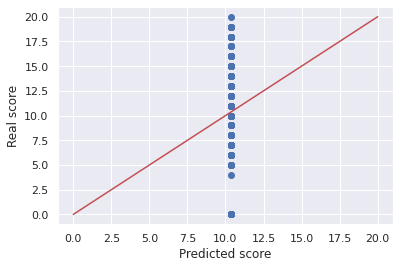

In [ ]:
predictions = mlpr.predict(X_train_mlp)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 8., 17., 18., 35., 47., 60., 49., 42., 31.,  9.]),
 array([10.34777152, 10.34897155, 10.35017158, 10.35137161, 10.35257164,
        10.35377166, 10.35497169, 10.35617172, 10.35737175, 10.35857178,
        10.35977181]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

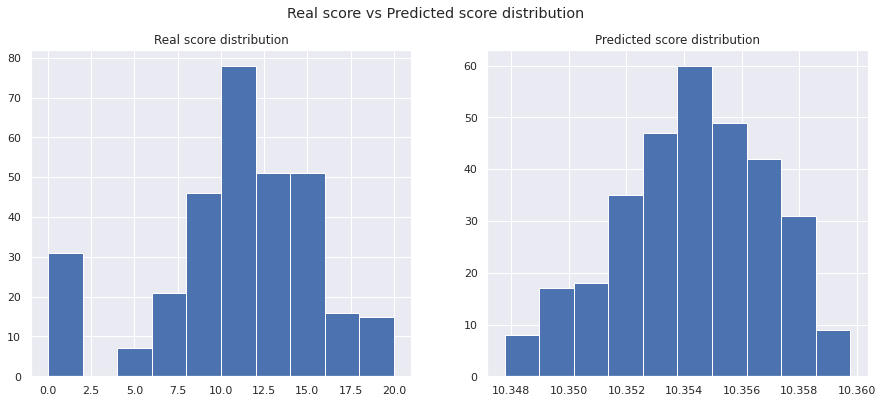

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

Claramente el modelo está haciendo underfitting, prácticamente es un modelo constante. Por los resultados de ejecuciones anteriores, creemos que esto se debe a que los modelos más complejos hacen overfitting y, al hacer el cross-validation, dan un peor score que un modelo que no aprende, esto es, que devuelve la media.

Vamos a modificar los parámetros para intentar evitar el overfitting de aquellos modelos más complejos. Para ello:


*   aumentamos el valor de alfa para aumentar la regularizacion
*   añadimos un máximo de iteraciones 




In [ ]:
t0= time.process_time()
mlpr = MLPRegressor(hidden_layer_sizes = (1500,800,200), verbose=True)
cv =  cross_val_score(mlpr, X_train_mlp, y_train, n_jobs=-1, verbose=5, cv=3)
t1 = time.process_time() - t0
print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time elapsed:  0.3647254530000055


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   51.5s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   51.5s finished


In [ ]:
parameters = {
    'hidden_layer_sizes': [(200,100),(400,200),(1000,500),(800,400,200),(1500,800,200)],
    'max_iter':[30,50],
    'activation': ['relu','tanh'],
    'solver': ['lbfgs'],
    'alpha': [1e-3, 0.1, 0.3],
    'learning_rate_init': [1e-3,0.1, 0.3]
    }


clf = GridSearchCV(MLPRegressor(verbose=True), parameters, n_jobs=-1,verbose=10, cv=5, scoring='r2')
clf.fit(X_train_mlp, y_train)

mlpr = clf.best_estimator_

Fitting 5 folds for each of 180 candidates, totalling 900 fits


GridSearchCV(cv=5, estimator=MLPRegressor(verbose=True), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh'],
                         'alpha': [0.001, 0.1, 0.3],
                         'hidden_layer_sizes': [(200, 100), (400, 200),
                                                (1000, 500), (800, 400, 200),
                                                (1500, 800, 200)],
                         'learning_rate_init': [0.001, 0.1, 0.3],
                         'max_iter': [30, 50], 'solver': ['lbfgs']},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(mlpr, X_train_mlp, y_train, n_jobs=-1, cv = 5,verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.



Best params: {'activation': 'relu', 'alpha': 0.3, 'hidden_layer_sizes': (1500, 800, 200), 'learning_rate_init': 0.001, 'max_iter': 30, 'solver': 'lbfgs'} Cross validation: [ 0.05464938 -0.05552458  0.03892174 -0.38665763 -0.15920994] R2 score mean: -0.10156420627925314


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   43.9s finished


In [ ]:
mlpr = MLPRegressor(activation='relu', alpha=1, hidden_layer_sizes=(400, 200), learning_rate_init=0.1, solver='lbfgs', max_iter=32)
mlpr.fit(X_train_mlp, y_train)

MLPRegressor(alpha=1, hidden_layer_sizes=(400, 200), learning_rate_init=0.1,
             max_iter=32, solver='lbfgs')

In [ ]:
cv =  cross_val_score(mlpr, X_train_mlp, y_train, n_jobs=-1, verbose=3, cv=4, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.



Best params: {'activation': 'relu', 'alpha': 0.3, 'hidden_layer_sizes': (1500, 800, 200), 'learning_rate_init': 0.001, 'max_iter': 30, 'solver': 'lbfgs'} Cross validation: [ 4.26485810e-02 -4.83959628e-05 -8.49002325e-02 -1.57875166e-01] R2 score mean: -0.05004380331617003


[Parallel(n_jobs=-1)]: Done   4 out of   4 | elapsed:    2.7s finished


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

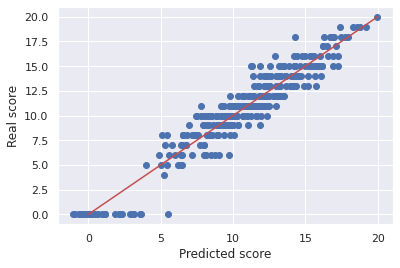

In [ ]:
predictions = mlpr.predict(X_train_mlp)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([18.,  9.,  8., 24., 52., 73., 64., 37., 25.,  6.]),
 array([-1.03479621,  1.06245682,  3.15970985,  5.25696288,  7.35421591,
         9.45146894, 11.54872197, 13.645975  , 15.74322803, 17.84048106,
        19.93773409]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

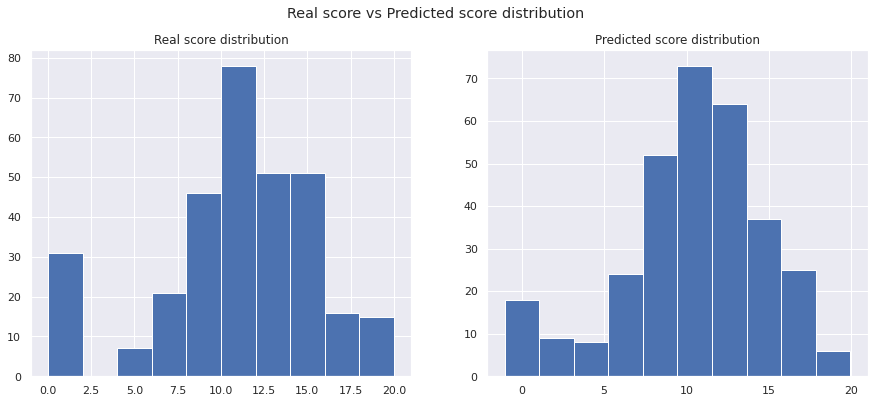

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
mydata = X_train_mlp.join(y_train)

In [ ]:
i = 0
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_mlp), feature_names=X_train_mlp.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_mlp.iloc[i],
    mlpr.predict, 
    num_features=10
)

Intercept 11.076861792570657
Prediction_local [7.08751697]
Right: 8.391494876391548


In [ ]:
exp.show_in_notebook(show_table=True)

Los resultados parecen bastante buenos. Los datos se ajustan bastante bien a la "Linea ideal" sin que llegue a parecer overfitting, pero el score del cross-validation nos hace pensar que sí que está haciéndolo. 

Además, parece que el modelo ha sido capaz de "aprender" aquellos casos en los que la nota era 0, cosa que los modelos lineales hasta ahora provados no habian conseguido. 

In [ ]:
X_train_mlp, _ = lr_preprocessingNoOHE(X_train, y_train)

In [ ]:
parameters = {
    'hidden_layer_sizes': [(1500,800,200),(3000,1200,500),(4000,1000,500),(4000,200,1000,500),(2000,1000,500,200)],
    'max_iter':[20,30,50],
    'activation': ['relu','tanh'],
    'solver': ['lbfgs'],
    'alpha': [1e-3, 0.1, 0.3],
    'learning_rate_init': [1e-3,0.1, 0.3]
    }


clf = GridSearchCV(MLPRegressor(verbose=True), parameters, n_jobs=-1,verbose=10, cv=3, scoring='r2')
clf.fit(X_train_mlp, y_train)

mlpr = clf.best_estimator_

Fitting 3 folds for each of 270 candidates, totalling 810 fits


GridSearchCV(cv=3, estimator=MLPRegressor(verbose=True), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh'],
                         'alpha': [0.001, 0.1, 0.3],
                         'hidden_layer_sizes': [(1500, 800, 200),
                                                (3000, 1200, 500),
                                                (4000, 1000, 500),
                                                (4000, 200, 1000, 500),
                                                (2000, 1000, 500, 200)],
                         'learning_rate_init': [0.001, 0.1, 0.3],
                         'max_iter': [20, 30, 50], 'solver': ['lbfgs']},
             scoring='r2', verbose=10)

In [ ]:
cv =  cross_val_score(mlpr, X_train_mlp, y_train, n_jobs=-1, cv = 5,verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.



Best params: {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (4000, 200, 1000, 500), 'learning_rate_init': 0.3, 'max_iter': 20, 'solver': 'lbfgs'} Cross validation: [0.34930698 0.30400888 0.12010509 0.05094243 0.29365401] R2 score mean: 0.22360347749844794


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   37.4s finished


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

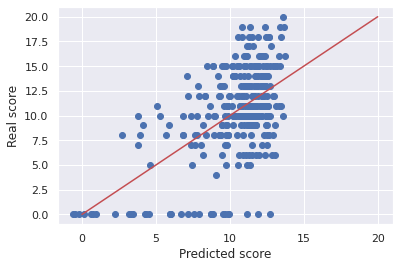

In [ ]:
predictions = mlpr.predict(X_train_mlp)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([  6.,   2.,   4.,   9.,   6.,  18.,  25.,  66., 120.,  60.]),
 array([-0.58724307,  0.84338577,  2.27401461,  3.70464345,  5.13527229,
         6.56590112,  7.99652996,  9.4271588 , 10.85778764, 12.28841648,
        13.71904532]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

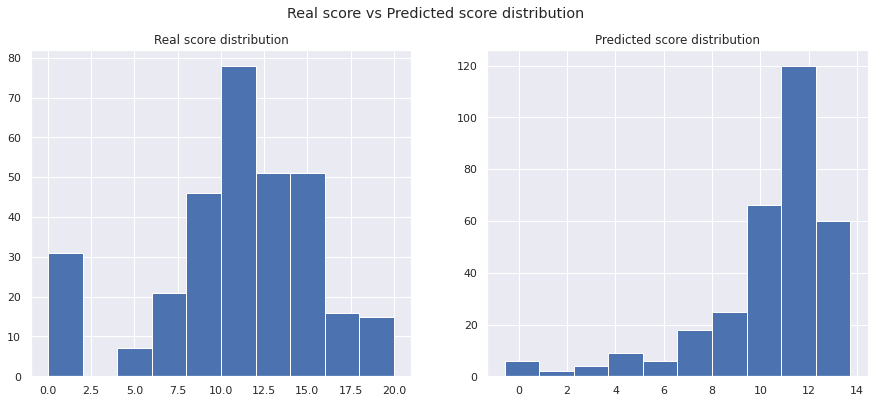

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
mydata = X_train_mlp.join(y_train)

In [ ]:
i = 0
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_mlp), feature_names=X_train_mlp.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_mlp.iloc[i],
    mlpr.predict, 
    num_features=10
)

Intercept 13.652825168926782
Prediction_local [6.30784896]
Right: 6.848177930279816


In [ ]:
exp.show_in_notebook(show_table=True)

Aunque la distribución de los puntos en la gráfica parece no ajustarse a la línea, guiándonos por el score del cross-validation, esta versión del modelo está haciendo un mejor trabajo que la anterior.

Las ausencias y el traveltime, como en el SVM cuadrático, siguen siendo variables que cuentan positivamente. 

Notamos que todos los modelos han decidido usar 'lbfgs' como solver, esto seguramente es debido a que nuestro dataset es muy pequeño y este tipo de solver se ajusta mejor.

### SVM with RBF kernel

In [ ]:
X_train_nlsvm, _ = lr_preprocessing(X_train, y_train)

In [ ]:
parameters = {
    'degree': [1,2,3],
    'epsilon':[0,0.1,0.5,1,3,5,7,8,9,10],
    'gamma':['scale', 'auto'],
    'C': [0,1e-2,0.1, 0.5,1,5]
}

clf = GridSearchCV(SVR(kernel='rbf'), parameters, cv=5, scoring='r2')
nlsvr = clf.fit(X_train_nlsvm, y_train)

In [ ]:
cv =  cross_val_score(nlsvr, X_train_nlsvm,y_train, cv = 5,verbose=3, scoring='r2')
print()
print('Best params:', nlsvr.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.034) total time=  14.4s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   14.4s remaining:    0.0s


[CV] END ................................ score: (test=0.066) total time=  14.2s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   28.6s remaining:    0.0s


[CV] END ................................ score: (test=0.110) total time=  14.2s
[CV] END ............................... score: (test=-0.030) total time=  13.6s
[CV] END ................................ score: (test=0.188) total time=  13.6s

Best params: {'C': 5, 'degree': 1, 'epsilon': 1, 'gamma': 'scale'} Cross validation: [ 0.0344581   0.06586466  0.10961076 -0.02961298  0.18798433] R2 score mean: 0.0736609728798385


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

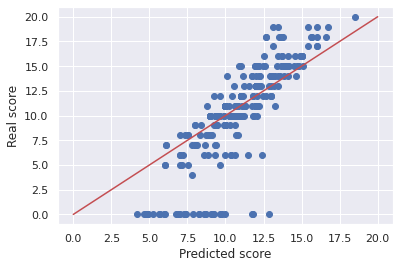

In [ ]:
predictions = nlsvr.predict(X_train_nlsvm)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 7., 15., 21., 54., 88., 59., 49., 15.,  7.,  1.]),
 array([ 4.17723546,  5.61153473,  7.04583399,  8.48013326,  9.91443252,
        11.34873178, 12.78303105, 14.21733031, 15.65162958, 17.08592884,
        18.5202281 ]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

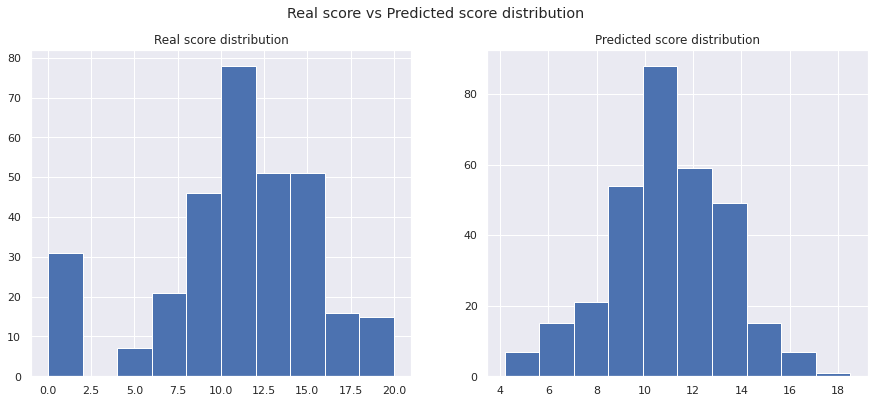

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
i = 0

explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_nlsvm), feature_names=X_train_nlsvm.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_nlsvm.iloc[i],
    nlsvr.predict, 
    num_features=10
)

exp.show_in_notebook(show_table=True)

Intercept 9.447463597102454
Prediction_local [9.83536625]
Right: 9.000195681852666


Como en los casos anteriores, parece que el modelo no predice bien con las variables codificadas usando one-hot encoding, así que volveremos a probar sin ellas.

Además, cabe notar que aunque este modelo no es lineal, a diferencia de las MLP, este modelo no ha sido capaz de aprender aquellos casos en los que la nota es igual a 0.

In [ ]:
X_train_nlsvm, _ = lr_preprocessingNoOHE(X_train, y_train)

parameters = {
    'degree': [1,2,3],
    'epsilon':[0,0.1,0.5,1,3,5,7,8,9,10],
    'gamma':['scale', 'auto'],
    'C': [0,1e-2,0.1, 0.5,1,5]
}

clf = GridSearchCV(SVR(kernel='rbf'), parameters, cv=5, scoring='r2')
clf.fit(X_train_nlsvm, y_train)
nlsvr = clf.best_estimator_

GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'C': [0, 0.01, 0.1, 0.5, 1, 5], 'degree': [1, 2, 3],
                         'epsilon': [0, 0.1, 0.5, 1, 3, 5, 7, 8, 9, 10],
                         'gamma': ['scale', 'auto']},
             scoring='r2')

In [ ]:
cv =  cross_val_score(nlsvr, X_train_nlsvm,y_train, cv = 5,verbose=3, scoring='r2')
print()
print('Best params:', clf.best_params_, 'Cross validation:', cv, 'R2 score mean:',np.mean(cv))


Best params: {'C': 5, 'degree': 1, 'epsilon': 3, 'gamma': 'scale'} Cross validation: [0.20478584 0.29135293 0.16401337 0.14524507 0.22917265] R2 score mean: 0.2069139711301496


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

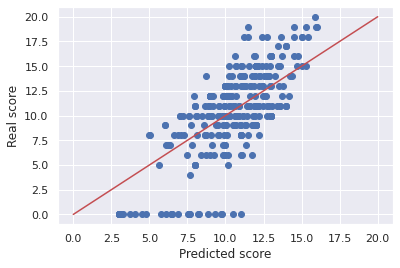

In [ ]:
predictions = nlsvr.predict(X_train_nlsvm)

plt.scatter(x=predictions, y=y_train)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([11.,  4., 14., 27., 36., 68., 77., 45., 23., 11.]),
 array([ 2.99978688,  4.29979316,  5.59979944,  6.89980572,  8.199812  ,
         9.49981828, 10.79982456, 12.09983084, 13.39983713, 14.69984341,
        15.99984969]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

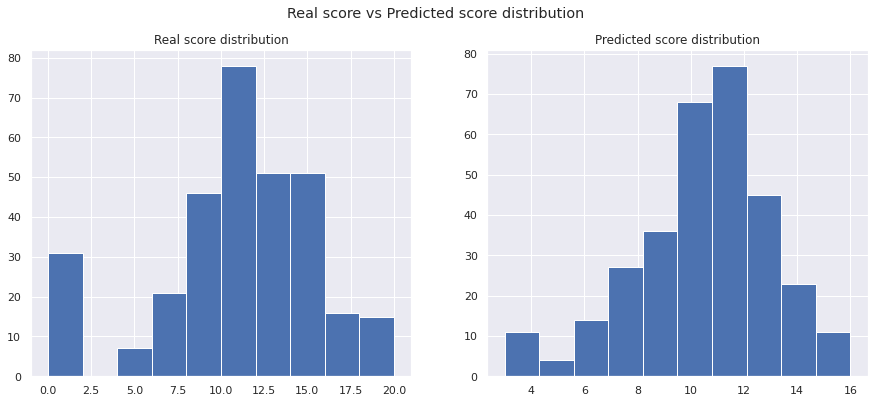

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

Caso habitual:

In [ ]:
i = 9

explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_nlsvm), feature_names=X_train_nlsvm.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_nlsvm.iloc[i],
    nlsvr.predict, 
    num_features=10
)

exp.show_in_notebook(show_table=True)

Intercept 7.04790379781394
Prediction_local [12.42054443]
Right: 13.034962303676952


Caso con muchas ausencias:

In [ ]:
i = 276
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.loc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 8.86791243154359
Prediction_local [11.10442748]
Right: 11.67901143714691


Su nota real es un 0:

In [ ]:
i = 259
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.loc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 7.632259496817992
Prediction_local [11.09640101]
Right: 11.965033134717618


Su nota real es un 0:

In [ ]:
i = 128
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_lr), feature_names=X_train_lr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_train_lr.loc[i],
    svr.predict, 
    num_features=10
)
exp.show_in_notebook(show_table=True)

Intercept 12.637604262382947
Prediction_local [5.06792863]
Right: 4.873906146284389


Como esperabamos, el modelo ahora predice mejor, aunque sigue siendo incapaz de aprender los casos en los que la nota es 0.

## Elección del modelo y resultados

Después de probar con los modelos, hemos obtenido los siguientes resultados:

Modelo | Score ($R^2$) | Time (s)
---|---|---
LR | 0.063 | 0.011
LR-reg | 0.054 | 0.006
LR-no-ohe | 0.206 | 0.004
LR-no-ohe-no-abs | 0.119 | 0.004
LASSO | 0.141 | 0.017
LASSO-no-ohe | 0.206 | 0.015
QSVM | 0.137 | 0.014
**QSVM-no-ohe** | **0.216** | **0.011**
MLP | -0.086 | 0.184
MLP-max-iter  | -0.101 | 23.476
MLP-no-ohe | 0.223 |19.296
SVMwithK | 0.073 | 0.017
SVMwithK-no-ohe |  0.2069 | 0.0149


Seleccionamos el modelo Quadratic SVM sin usar las variables codificadas con one-hot encoding, ya que obtenemos el segundo mejor resultado con él y tiene un tiempo de entrenamiento muy inferior al modelo MLP-no-ohe.

A continuación, vamos a probar que tan bueno es nuestro modelo final. Para ello usaremos la partición de test del 20% que apartamos al inicio.



In [ ]:
X_train_svr, _ = lr_preprocessingNoOHE(X_train, y_train)
svr = SVR(kernel='poly', C = 10, degree = 1, epsilon = 5, gamma = 'auto')
svr.fit(X_train_svr, y_train)

X_test_svr, _ = lr_preprocessingNoOHE(X_test, y_test)
print("Score: ", svr.score(X_test_svr, y_test))

SVR(C=10, degree=1, epsilon=5, gamma='auto', kernel='poly')

Score:  0.14903541736319637


Text(0.5, 0, 'Predicted score')

Text(0, 0.5, 'Real score')

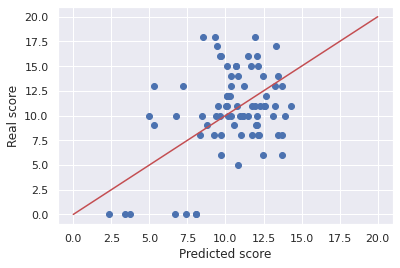

In [ ]:
predictions = svr.predict(X_test_svr)

plt.scatter(x=predictions, y=y_test)
plt.plot([0, 20], [0, 20], 'r')
plt.xlabel("Predicted score")
plt.ylabel("Real score")

Text(0.5, 0.98, 'Real score vs Predicted score distribution')

(array([31.,  0.,  7., 21., 46., 78., 51., 51., 16., 15.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Real score distribution')

(array([ 2.,  1.,  3.,  2.,  5.,  8., 19., 13., 16., 10.]),
 array([ 2.37591615,  3.56916186,  4.76240757,  5.95565328,  7.14889899,
         8.3421447 ,  9.53539041, 10.72863612, 11.92188183, 13.11512755,
        14.30837326]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'Predicted score distribution')

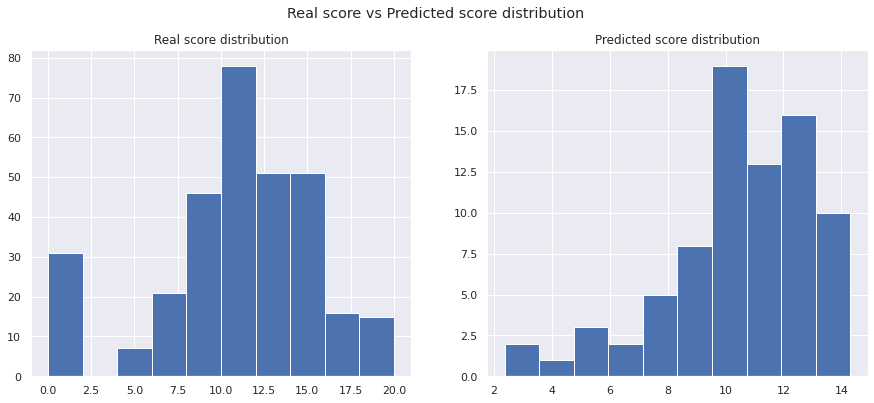

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
fig.suptitle('Real score vs Predicted score distribution')
ax1.hist(y_train)
ax1.set_title('Real score distribution')
ax2.hist(predictions)
ax2.set_title('Predicted score distribution')

In [ ]:
from random import randrange

i = randrange(len(y_test))
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_svr), feature_names=X_train_svr.columns,  verbose=True, mode='regression')
exp = explainer.explain_instance(
    X_test_svr.iloc[i],
    svr.predict, 
    num_features=10
)

Intercept 7.347978396524242
Prediction_local [12.30417138]
Right: 12.057541749696096


In [ ]:
exp.show_in_notebook(show_table=True)

Tras probar con datos que el modelo nunca había visto, hemos obtenido un score un poco bajo. Aunque es de esperar que al probar con los datos del test el score sea inferior, al partir ya de un score con los datos de entrenamiento muy bajo, consideramos que el resultado es malo. 

Con un $R^2=0.149$, no podemos decir que hayamos obtenido un modelo capaz de predecir las notas de los alumnos de instituto portigueses teniendo en cuenta los datos que teníamos sobre su situación personal.